In [15]:
import os
import glob
import random
import multiprocessing
import copy
import pprint
from pathlib import Path
import time
from datetime import datetime
from typing import Optional, Union, Tuple

import enum
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython import display
import seaborn as sns
from skimage.util import montage
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from scipy import stats
import nrrd
import torch
from torch import nn
import torchio as tio
import torchvision
import torch.nn.functional as F
from torchvision.ops.focal_loss import sigmoid_focal_loss
from unet import UNet
from torchinfo import summary


seed = 2022

random.seed(seed)
torch.manual_seed(seed)
num_workers = multiprocessing.cpu_count()


path_saved_models = os.path.join(os.getcwd(), '..', 'saved_models')
path_data = os.path.join(os.getcwd(), '..', 'data')
path_eda = os.path.join(path_data, 'eda')
path_segmentation = os.path.join(path_data, 'segmentation_xyz')
path_cropped = os.path.join(path_data, 'segmentation_xyz_cropped')
path_saved_images = os.path.join(os.getcwd(), 'thesis_images')

if not os.path.isdir(path_saved_models):
    os.mkdir(path_saved_models)
    
if not os.path.isdir(path_saved_images):
    os.mkdir(path_saved_images)

In [2]:
class Visualizer:
    
    def montage_nrrd(self, image):
        if len(image.shape) > 2:
            return montage(image)
        else:
            warnings.warn('Pass a 3D volume', RuntimeWarning)
            return image
        
    def visualize(self, image, mask=None):
        
        if mask is None:
            fig, axes = plt.subplots(1, 1, figsize=(10, 10))
            axes.imshow(self.montage_nrrd(image))
            axes.set_axis_off()
        else:
            fig, axes = plt.subplots(1, 2, figsize=(40, 40))
        
            for i, data in enumerate([image, mask]):
                axes[i].imshow(self.montage_nrrd(data))
                axes[i].set_axis_off()
                
                
vis = Visualizer()

In [3]:
df = pd.read_csv(os.path.join(path_eda, 'spect_data.csv'))

df.head()

,image,image_slices,image_height,image_width,mask,mask_slices,mask_height,mask_width,slices_positive,positive_pixels_ratio,positive_ratio,positive_slice_ratio
0,1.nrrd,62,64,64,1_Segmentation.nrrd,62.0,64.0,64.0,11.0,0.002788,0.177419,0.18 %
1,2.nrrd,64,64,64,2_Segmentation.nrrd,64.0,64.0,64.0,9.0,0.001781,0.140625,0.14 %
2,3.nrrd,64,64,64,3_Segmentation.nrrd,64.0,64.0,64.0,12.0,0.006973,0.187500,0.19 %
3,4.nrrd,64,64,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.nrrd,128,128,128,5_Segmentation.nrrd,128.0,128.0,128.0,22.0,0.001923,0.171875,0.17 %


In [4]:
def load_image(path):
    
    data, header = nrrd.read(path)
    data = data.astype(np.float32)
    affine = np.eye(4)
    
    return data, affine

In [5]:
subjects = []

segmentations = list(df.loc[(df['mask'].isnull()), ['image']].to_records(index=False))
segmentations = list(map(
    lambda x: os.path.join(path_cropped, x[0]), 
    segmentations
))

for image_path in segmentations:

    subject = tio.Subject(spect=tio.ScalarImage(image_path, reader=load_image))
    subjects.append(subject)

dataset = tio.SubjectsDataset(subjects)
print(f"Dataset size: {len(dataset)} subjects")

Dataset size: 92 subjects


In [6]:
target_shape = (128, 128, 32)
max_displacement = (8, 8, 0)
num_control_points = 10


training_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    tio.ZNormalization(),
    tio.RandomFlip(axes=(0, 1, 2), p=0.5),
    tio.OneOf({
        tio.RandomAnisotropy(p=0.5),
        tio.RandomBlur(p=0.5),
        tio.RandomNoise(p=0.5),  
    }, p=0.5),
    tio.OneOf({
        tio.RandomAffine(): 0.6,
        tio.RandomElasticDeformation(max_displacement=max_displacement): 0.2,
        tio.RandomElasticDeformation(
            max_displacement=max_displacement,
            num_control_points=num_control_points
        ): 0.2
    }, p=0.8),
])

validation_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    tio.ZNormalization()
])

In [7]:
patch_loc_arr = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 3), (3, 1), (3, 2), (3, 3)]

offset_x: 16, offset_y: 16
start_grid_x: 14, start_grid_y: 7
patch_x: 98, patch_y: 7


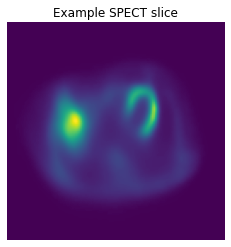

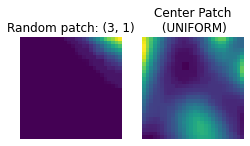

In [43]:
# paper - gap approx. half the patch width
# paper - random jitter for each patch approx. 7 pixels 

subject_idx = np.random.randint(len(subjects))

volume = subjects[subject_idx].spect.data

# augment

volume = training_transform(volume)


idx = np.random.randint(0, volume.shape[-1])

image = volume[0, ..., idx].numpy()


patch_dim = 28
gap = 14

offset_x = image.shape[0] - (patch_dim * 3 + gap * 2)
offset_y = image.shape[1] - (patch_dim * 3 + gap * 2)

print(f'offset_x: {offset_x}, offset_y: {offset_y}')

start_grid_x = np.random.randint(0, offset_x)
start_grid_y = np.random.randint(0, offset_y)

print(f'start_grid_x: {start_grid_x}, start_grid_y: {start_grid_y}')

loc = np.random.randint(len(patch_loc_arr))

tempx, tempy = patch_loc_arr[loc]

patch_x_pt = start_grid_x + patch_dim * (tempx - 1) + gap * (tempx - 1)
patch_y_pt = start_grid_y + patch_dim * (tempy - 1) + gap * (tempy - 1)

print(f'patch_x: {patch_x_pt}, patch_y: {patch_y_pt}')

plt.title('Example SPECT slice')
plt.axis('off')
plt.imshow(image)

random_patch = image[patch_x_pt: patch_x_pt + patch_dim, patch_y_pt: patch_y_pt + patch_dim]

plt.subplots(figsize=(4,4))
plt.subplot(121)
plt.imshow(random_patch)
plt.title(f'Random patch: ({tempx}, {tempy})')
plt.axis('off')

# Get the center patch (uniform across all the images)
patch_x_pt = start_grid_x + patch_dim * (2-1) + gap * (2-1)
patch_y_pt = start_grid_y + patch_dim * (2-1) + gap * (2-1)
center_patch = image[patch_x_pt: patch_x_pt + patch_dim, patch_y_pt: patch_y_pt + patch_dim]

plt.subplot(122)
plt.imshow(center_patch)
plt.title('Center Patch\n (UNIFORM)')
plt.axis('off')

#plt.savefig(os.path.join(path_saved_images, 'relative_patch_location_example.png'))

plt.show()

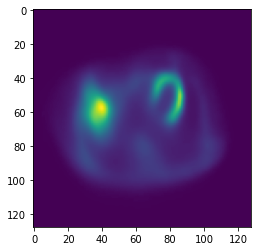

[]

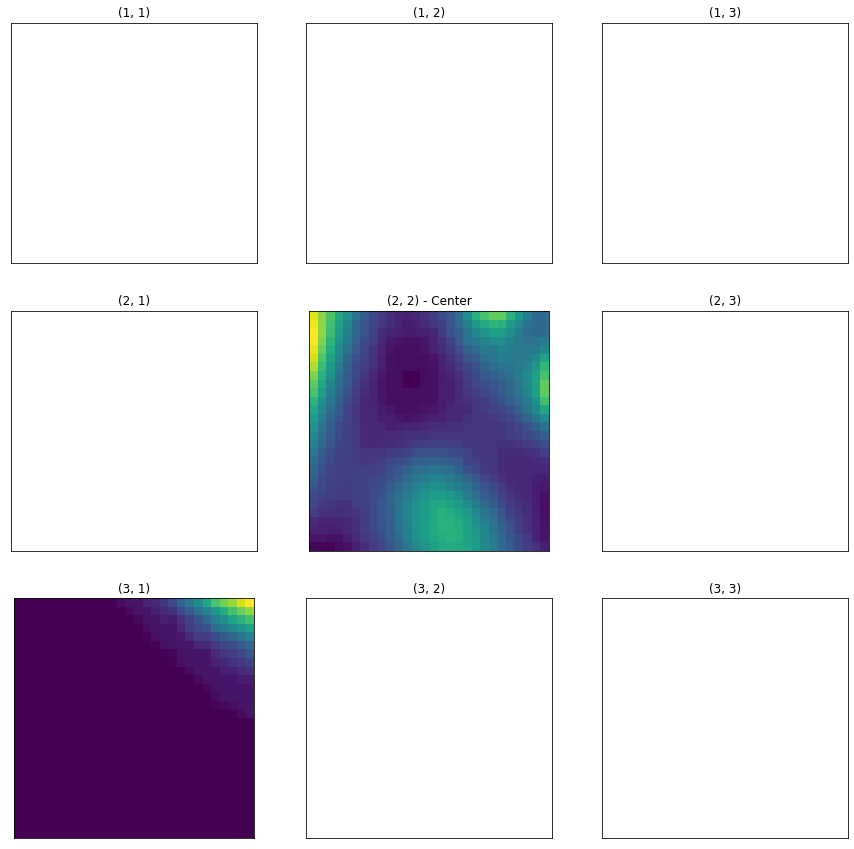

In [44]:
plt.imshow(image)
plt.show()
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15,15))

for i, (t_x, t_y) in enumerate(patch_loc_arr):
    if t_x == tempx and t_y == tempy:

        ax[t_x-1, t_y-1].imshow(random_patch)
        ax[t_x-1, t_y-1].set_title(str(patch_loc_arr[i]))
        ax[t_x-1, t_y-1].set_xticks([])
        ax[t_x-1, t_y-1].set_yticks([])
    else:
        ax[t_x-1, t_y-1].set_title(str(patch_loc_arr[i]))
        ax[t_x-1, t_y-1].set_xticks([])
        ax[t_x-1, t_y-1].set_yticks([])

# Add patch to the center (Uniform patch)
ax[2-1,2-1].imshow(center_patch)
ax[2-1,2-1].set_title(str('(2, 2) - Center'))
ax[2-1,2-1].set_xticks([])
ax[2-1,2-1].set_yticks([])

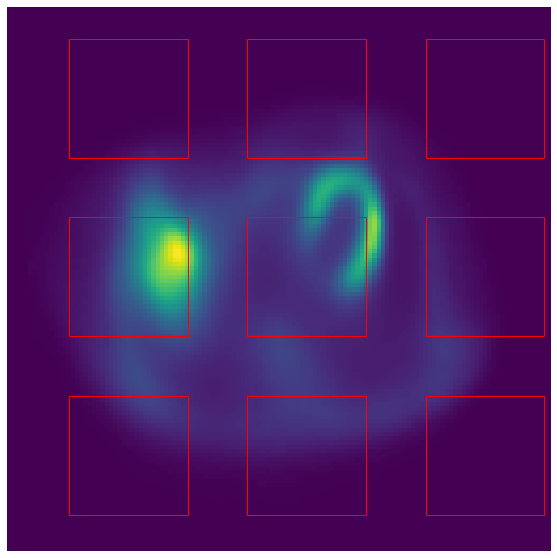

In [47]:
all_patch_loc = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 2), (2, 3), (3, 1), (3, 2), (3, 3)]

fig, ax = plt.subplots(figsize=(10,10))

#plt.title('Example SPECT slice with randomized patch locations')
plt.axis('off')
ax.imshow(image)

for tempx, tempy in all_patch_loc:

    patch_x_pt = start_grid_x + patch_dim * (tempx - 1) + gap * (tempx - 1)
    patch_y_pt = start_grid_y + patch_dim * (tempy - 1) + gap * (tempy - 1)
    
    rect = patches.Rectangle(
        (patch_x_pt, patch_y_pt), 
        width=patch_dim, 
        height=patch_dim,
        linewidth=1, 
        edgecolor='r', 
        facecolor='none'
    )
    ax.add_patch(rect)

plt.show()

## Volumetric patches - try use all dimensions first

In [48]:
patch_x_pt = start_grid_x + patch_dim * (tempx - 1) + gap * (tempx - 1)
patch_y_pt = start_grid_y + patch_dim * (tempy - 1) + gap * (tempy - 1)

random_volume_patch = volume[:, patch_x_pt: patch_x_pt + patch_dim, patch_y_pt: patch_y_pt + patch_dim, :]

# Get the center patch (uniform across all the images)
patch_x_pt = start_grid_x + patch_dim * (2-1) + gap * (2-1)
patch_y_pt = start_grid_y + patch_dim * (2-1) + gap * (2-1)

center_volume_patch = volume[:, patch_x_pt: patch_x_pt + patch_dim, patch_y_pt: patch_y_pt + patch_dim, :]

In [49]:
print(f'Center volume patch shape: {center_volume_patch.numpy().shape}')
print(f'Random volume patch shape: {random_volume_patch.numpy().shape}')

Center volume patch shape: (1, 28, 28, 32)
Random volume patch shape: (1, 28, 28, 32)


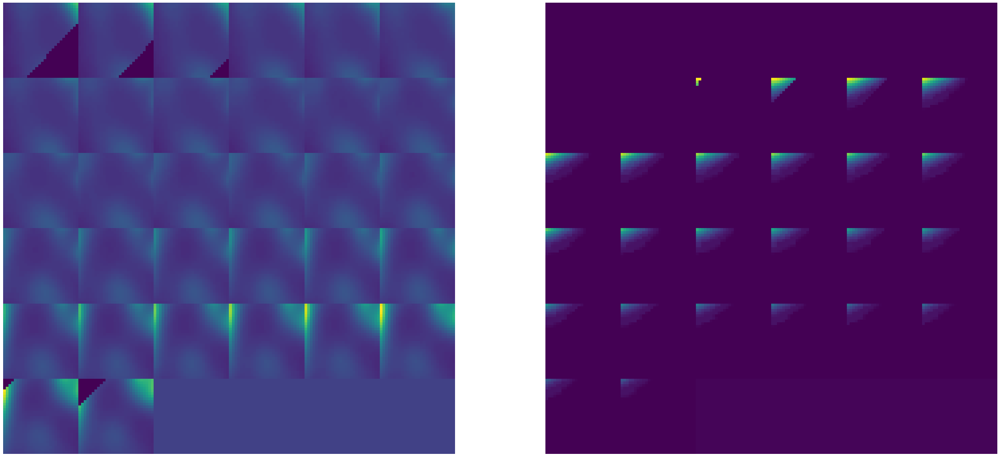

In [51]:
vis.visualize(
    center_volume_patch.permute(0, 3, 1, 2).squeeze(0).numpy(),
    random_volume_patch.permute(0, 3, 1, 2).squeeze(0).numpy()
)

In [52]:
random_volume_patch.permute(0, 3, 1, 2).squeeze(0).numpy().shape

(32, 28, 28)

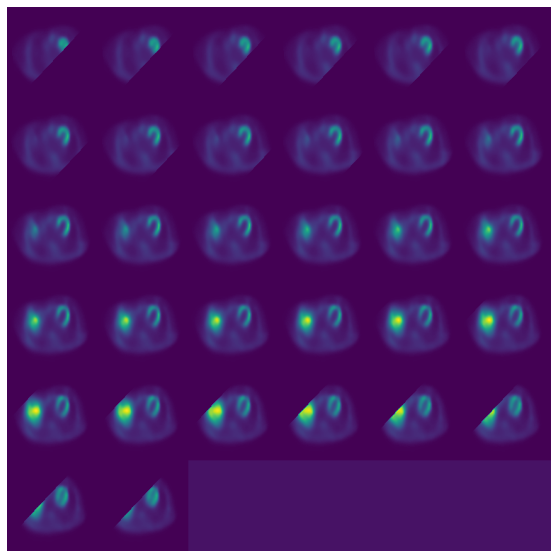

In [53]:
vis.visualize(volume.permute(0, 3, 1, 2).squeeze(0).numpy())

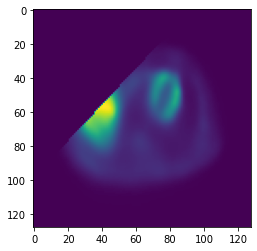

In [54]:
plt.imshow(volume.permute(0, 3, 1, 2).squeeze(0).numpy()[28, ...])

In [6]:
class GetPatches:
    def __init__(self, patch_dim, gap):
        self.patch_dim = patch_dim
        self.gap = gap
        self.patch_loc_arr = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 3), (3, 1), (3, 2), (3, 3)]
        
    def __call__(self, sample):
        
        volume = sample.spect.data
        
        offset_x = volume.shape[1] - (self.patch_dim * 3 + self.gap * 2)
        offset_y = volume.shape[2] - (self.patch_dim * 3 + self.gap * 2)

        start_grid_x = np.random.randint(0, offset_x)
        start_grid_y = np.random.randint(0, offset_y)

        random_patch_label = np.random.randint(len(self.patch_loc_arr))
        tempx, tempy = self.patch_loc_arr[random_patch_label]

        rp_x_pt = start_grid_x + self.patch_dim * (tempx - 1) + self.gap * (tempx - 1)
        rp_y_pt = start_grid_y + self.patch_dim * (tempy - 1) + self.gap * (tempy - 1)
        
        random_patch = volume[
            :,
            rp_x_pt: rp_x_pt + self.patch_dim, 
            rp_y_pt: rp_y_pt + self.patch_dim,
            :
        ]
        cp_x_pt = start_grid_x + self.patch_dim + self.gap
        cp_y_pt = start_grid_y + self.patch_dim + self.gap
        
        center_patch = volume[
            :,
            cp_x_pt: cp_x_pt + self.patch_dim, 
            cp_y_pt: cp_y_pt + self.patch_dim,
            :
        ]
        random_patch_label = torch.tensor(random_patch_label, dtype=torch.long)
        
        return center_patch, random_patch, random_patch_label

## Normalize each patch separately

In [7]:
class NormalizePatches:
    def __init__(self):
        self.normalize = tio.ZNormalization()
        
    def __call__(self, sample):
        center_patch, random_patch, random_patch_label = sample
        
        try:
            cp = self.normalize(center_patch)
            rp = self.normalize(random_patch)
            
            return cp, rp, random_patch_label
        except:
            cp_cond = torch.all(center_patch == 0)
            rp_cond = torch.all(random_patch == 0)
            cp = self.normalize(center_patch) if not cp_cond else center_patch
            rp = self.normalize(random_patch) if not rp_cond else random_patch
            
            return cp, rp, random_patch_label

In [8]:
target_shape = (128, 128, 32)
max_displacement = (8, 8, 0)
num_control_points = 10

patch_dim = 28
gap = 14


training_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    GetPatches(patch_dim, gap),
    NormalizePatches()
])

validation_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    GetPatches(patch_dim, gap),
    NormalizePatches()
])

In [8]:
class UnetEncoderSSL(nn.Module):
    def __init__(
        self, 
        patch_dim_x=28,
        patch_dim_z = 32,
        num_encoding_blocks=3,
        out_channels_first_layer=8,
        normalization='batch',
        reduction_factor=64, # for dense connections from conv layer
        dropout=0,
        n_patches=2
    ):
        super().__init__()
        
        self.patch_dim_x = patch_dim_x
        self.patch_dim_z = patch_dim_z
        self.num_encoding_blocks = num_encoding_blocks
        self.normalization = normalization
        self.dropout = dropout
        self.n_patches = n_patches
        
        self.encoder = UNet(
            in_channels=1,
            out_classes=2,
            dimensions=3,
            num_encoding_blocks=num_encoding_blocks,
            out_channels_first_layer=out_channels_first_layer,
            normalization=normalization,
            upsampling_type='linear',
            padding=True,
            activation='PReLU',
            dropout=dropout
        ).encoder

        dx = patch_dim_x // 2**(num_encoding_blocks - 1)
        dz = patch_dim_z // 2**(num_encoding_blocks - 1)
        n_in = (num_encoding_blocks + 1) * out_channels_first_layer * dx**2 * dz
        n_out = n_in // reduction_factor
        
        self.fc1 = nn.Sequential(
            nn.Linear(n_in, n_out),
            nn.PReLU(),
            nn.BatchNorm1d(n_out)
        )
        self.fc = nn.Sequential(
            nn.Linear(self.n_patches * n_out, n_out // 2),
            nn.PReLU(),
            nn.Linear(n_out // 2, 8)
        )
        
        
    def forward_once(self, x):
        
        skip_connections, output = self.encoder(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        
        return output
    
    def forward(self, input1, input2):
        
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output = torch.cat((output1, output2), dim=1)
        output = self.fc(output)
        
        return output

In [59]:
class Action(enum.Enum):
    TRAIN = 'Training'
    VALIDATE = 'Validation'
    

def prepare_batch(batch, device):
    
    inputs1, inputs2, targets = batch
    inputs1 = inputs1.to(device)
    inputs2 = inputs2.to(device)
    targets = targets.to(device)
    
    return inputs1, inputs2, targets


def run_epoch(epoch_idx, action, loader, model, criterion, optimizer):
    
    is_training = action == Action.TRAIN
    epoch_losses = []
    accuracies = []
    model.train(is_training)
    
    for batch_idx, batch in enumerate(tqdm(loader)):
        
        inputs1, inputs2, targets = prepare_batch(batch, device)
        optimizer.zero_grad()
    
        with torch.set_grad_enabled(is_training):
            
            # CrossEntropyLoss combines LogSoftmax with NLLLOSS
            outputs = model(inputs1, inputs2)
            batch_losses = criterion(outputs, targets)
            batch_loss = batch_losses.mean()
            accuracy = ((outputs.argmax(axis=1) == targets).sum() / len(outputs)).cpu().item()
            accuracies.append(accuracy)
            
            if is_training:
            
                batch_loss.backward()
                optimizer.step()
            
            epoch_losses.append(batch_loss.item())
    
    epoch_losses = np.array(epoch_losses).mean()
    accuracies = np.array(accuracies).mean()
    
    """
    if accuracies > best_accuracy and not is_training:
        print(f'Saving model at epoch: {epoch_idx}')
        best_accuracy = accuracies
        checkpoint = {
            'weights': model.state_dict()
        }
        torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))
    """
    print(f'{action.value} mean loss: {epoch_losses.mean():0.3f}\tAccuracy: {accuracies:.2f}')
    
    return time.time(), epoch_losses, accuracies


def train(num_epochs, training_loader, validation_loader, model, criterion, optimizer):
    
    train_losses = []
    val_losses = []
    
    for epoch_idx in range(1, num_epochs + 1):
    
        print('Starting epoch', epoch_idx)
        train_losses.append(run_epoch(epoch_idx, Action.TRAIN, training_loader, model, criterion, optimizer))
        val_losses.append(run_epoch(epoch_idx, Action.VALIDATE, validation_loader, model, criterion, optimizer))
    
    return np.array(train_losses), np.array(val_losses)


def plot_times(axis, losses, label):
    
    times, losses, _ = losses.transpose(1, 0)
    times = [datetime.fromtimestamp(x) for x in times]
    axis.plot(times, losses.flatten(), label=label)
    
    
def plot_epochs(axis, losses, label):
    
    _, losses, _ = losses.transpose(1, 0)
    epochs = [i for i in range(1, len(losses.flatten()) + 1)]
    axis.plot(epochs, losses.flatten(), label=label)
    
    
def plot_accuracies(axis, losses, label):
    
    _, losses, accuracies = losses.transpose(1, 0)
    epochs = [i for i in range(1, len(losses.flatten()) + 1)]
    axis.plot(epochs, accuracies.flatten(), label=label)

In [53]:
training_split_ratio = 0.85

num_subjects = len(dataset)

num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = (num_training_subjects, num_validation_subjects)
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

print('Training set:', len(training_set), 'subjects')
print('Validation set:', len(validation_set), 'subjects')

Training set: 78 subjects
Validation set: 14 subjects


In [48]:
training_batch_size = 8
validation_batch_size = 2 * training_batch_size

training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=training_batch_size,
    shuffle=True,
    num_workers=0,
)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=validation_batch_size,
    num_workers=0,
)

In [46]:
exp_name = 'relative_patch_baseline'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100

model = UnetEncoderSSL(normalization='instance', )
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters())
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
#torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.650	Accuracy: 0.34


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.520	Accuracy: 0.50
Starting epoch 2


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.024	Accuracy: 0.63


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.001	Accuracy: 0.71
Starting epoch 3


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.908	Accuracy: 0.70


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.625	Accuracy: 0.79
Starting epoch 4


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.876	Accuracy: 0.66


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.514	Accuracy: 0.86
Starting epoch 5


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.799	Accuracy: 0.71


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.710	Accuracy: 0.79
Starting epoch 6


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.868	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.018	Accuracy: 0.64
Starting epoch 7


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.917	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.055	Accuracy: 0.79
Starting epoch 8


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.658	Accuracy: 0.77


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.761	Accuracy: 0.79
Starting epoch 9


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.557	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.156	Accuracy: 0.64
Starting epoch 10


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.796	Accuracy: 0.70


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.653	Accuracy: 0.71
Starting epoch 11


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.988	Accuracy: 0.63


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.939	Accuracy: 0.50
Starting epoch 12


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.655	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.853	Accuracy: 0.71
Starting epoch 13


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.997	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.650	Accuracy: 0.86
Starting epoch 14


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.755	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.504	Accuracy: 0.79
Starting epoch 15


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.732	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.636	Accuracy: 0.79
Starting epoch 16


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.582	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.908	Accuracy: 0.79
Starting epoch 17


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.685	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.194	Accuracy: 1.00
Starting epoch 18


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.726	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.554	Accuracy: 0.71
Starting epoch 19


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.663	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.155	Accuracy: 1.00
Starting epoch 20


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.637	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.111	Accuracy: 1.00
Starting epoch 21


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.516	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.981	Accuracy: 0.64
Starting epoch 22


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.494	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.521	Accuracy: 0.86
Starting epoch 23


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.563	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.216	Accuracy: 0.93
Starting epoch 24


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.533	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.181	Accuracy: 0.64
Starting epoch 25


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.462	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.147	Accuracy: 0.64
Starting epoch 26


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.560	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.376	Accuracy: 0.79
Starting epoch 27


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.519	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.761	Accuracy: 0.86
Starting epoch 28


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.602	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.455	Accuracy: 0.86
Starting epoch 29


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.631	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.623	Accuracy: 0.86
Starting epoch 30


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.654	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.675	Accuracy: 0.79
Starting epoch 31


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.595	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.095	Accuracy: 1.00
Starting epoch 32


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.652	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.837	Accuracy: 0.79
Starting epoch 33


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.489	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.223	Accuracy: 0.86
Starting epoch 34


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.652	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.452	Accuracy: 0.71
Starting epoch 35


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.410	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.558	Accuracy: 0.93
Starting epoch 36


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.641	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.205	Accuracy: 0.93
Starting epoch 37


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.361	Accuracy: 0.90


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.108	Accuracy: 0.86
Starting epoch 38


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.608	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.424	Accuracy: 0.79
Starting epoch 39


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.636	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.371	Accuracy: 0.93
Starting epoch 40


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.400	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.765	Accuracy: 0.71
Starting epoch 41


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.526	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.747	Accuracy: 0.79
Starting epoch 42


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.512	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.374	Accuracy: 0.93
Starting epoch 43


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.469	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.509	Accuracy: 0.86
Starting epoch 44


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.460	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.890	Accuracy: 0.64
Starting epoch 45


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.525	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.851	Accuracy: 0.71
Starting epoch 46


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.456	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.525	Accuracy: 0.86
Starting epoch 47


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.445	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.223	Accuracy: 0.93
Starting epoch 48


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.458	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.142	Accuracy: 1.00
Starting epoch 49


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.455	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.345	Accuracy: 0.86
Starting epoch 50


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.451	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.446	Accuracy: 0.93
Starting epoch 51


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.403	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.144	Accuracy: 0.93
Starting epoch 52


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.606	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.442	Accuracy: 0.93
Starting epoch 53


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.269	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.216	Accuracy: 0.93
Starting epoch 54


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.740	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.129	Accuracy: 1.00
Starting epoch 55


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.491	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.259	Accuracy: 0.93
Starting epoch 56


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.518	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.436	Accuracy: 0.79
Starting epoch 57


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.488	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.571	Accuracy: 0.86
Starting epoch 58


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.550	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.198	Accuracy: 0.93
Starting epoch 59


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.413	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.803	Accuracy: 0.86
Starting epoch 60


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.278	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.223	Accuracy: 0.93
Starting epoch 61


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.438	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.115	Accuracy: 1.00
Starting epoch 62


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.336	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.439	Accuracy: 0.93
Starting epoch 63


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.529	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.388	Accuracy: 0.93
Starting epoch 64


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.562	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.478	Accuracy: 0.71
Starting epoch 65


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.496	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.476	Accuracy: 0.93
Starting epoch 66


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.471	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.122	Accuracy: 0.93
Starting epoch 67


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.523	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.265	Accuracy: 0.93
Starting epoch 68


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.449	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.360	Accuracy: 0.86
Starting epoch 69


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.341	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.589	Accuracy: 0.86
Starting epoch 70


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.388	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.449	Accuracy: 0.93
Starting epoch 71


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.344	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.173	Accuracy: 0.93
Starting epoch 72


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.420	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.598	Accuracy: 0.71
Starting epoch 73


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.527	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.926	Accuracy: 0.79
Starting epoch 74


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.310	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.516	Accuracy: 0.79
Starting epoch 75


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.194	Accuracy: 0.96


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.548	Accuracy: 0.86
Starting epoch 76


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.330	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.246	Accuracy: 0.86
Starting epoch 77


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.331	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.392	Accuracy: 0.86
Starting epoch 78


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.341	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.261	Accuracy: 0.93
Starting epoch 79


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.474	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.383	Accuracy: 0.86
Starting epoch 80


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.327	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.509	Accuracy: 0.79
Starting epoch 81


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.508	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.795	Accuracy: 0.71
Starting epoch 82


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.442	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.342	Accuracy: 0.93
Starting epoch 83


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.516	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.122	Accuracy: 0.93
Starting epoch 84


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.479	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.868	Accuracy: 0.79
Starting epoch 85


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.423	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.629	Accuracy: 0.86
Starting epoch 86


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.234	Accuracy: 0.93


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.148	Accuracy: 0.93
Starting epoch 87


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.268	Accuracy: 0.93


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.115	Accuracy: 0.79
Starting epoch 88


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.409	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.285	Accuracy: 0.71
Starting epoch 89


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.404	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.307	Accuracy: 0.93
Starting epoch 90


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.327	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.083	Accuracy: 1.00
Starting epoch 91


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.237	Accuracy: 0.94


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.116	Accuracy: 1.00
Starting epoch 92


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.288	Accuracy: 0.95


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.953	Accuracy: 0.64
Starting epoch 93


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.222	Accuracy: 0.94


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.320	Accuracy: 0.86
Starting epoch 94


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.327	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.561	Accuracy: 0.93
Starting epoch 95


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.310	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.130	Accuracy: 0.93
Starting epoch 96


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.416	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.780	Accuracy: 0.93
Starting epoch 97


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.250	Accuracy: 0.94


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.219	Accuracy: 0.93
Starting epoch 98


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.261	Accuracy: 0.93


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.035	Accuracy: 1.00
Starting epoch 99


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.279	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.271	Accuracy: 0.86
Starting epoch 100


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.458	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.141	Accuracy: 0.93


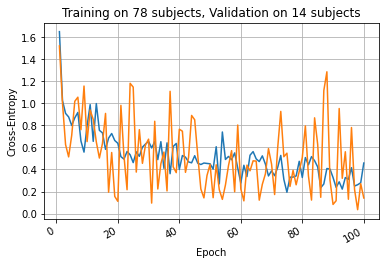

In [47]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

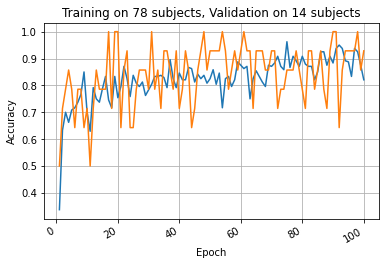

In [48]:
fig, ax = plt.subplots()
plot_accuracies(ax, train_losses, 'Training')
plot_accuracies(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [42]:
summary(model)

Layer (type:depth-idx)                                  Param #
UnetEncoderSSL                                          --
├─Encoder: 1-1                                          --
│    └─ModuleList: 2-1                                  --
│    │    └─EncodingBlock: 3-1                          3,682
│    │    └─EncodingBlock: 3-2                          20,738
├─Sequential: 1-2                                       --
│    └─Linear: 2-2                                      2,458,820
│    └─PReLU: 2-3                                       1
│    └─BatchNorm1d: 2-4                                 392
├─Sequential: 1-3                                       --
│    └─Linear: 2-5                                      38,514
│    └─PReLU: 2-6                                       1
│    └─Linear: 2-7                                      792
Total params: 2,522,940
Trainable params: 2,522,940
Non-trainable params: 0

## Instable training -> GroupNorm, Decrease LR, Decrease Number of Parameters

In [53]:
exp_name = 'relative_patch_baseline'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100
learning_rate = 1e-5

model = UnetEncoderSSL(normalization='instance')
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 2.066	Accuracy: 0.19


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 2.006	Accuracy: 0.14
Starting epoch 2


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.926	Accuracy: 0.33


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.889	Accuracy: 0.43
Starting epoch 3


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.844	Accuracy: 0.38


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.813	Accuracy: 0.57
Starting epoch 4


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.807	Accuracy: 0.46


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.724	Accuracy: 0.36
Starting epoch 5


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.642	Accuracy: 0.61


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.782	Accuracy: 0.57
Starting epoch 6


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.610	Accuracy: 0.58


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.601	Accuracy: 0.50
Starting epoch 7


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.495	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.711	Accuracy: 0.43
Starting epoch 8


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.518	Accuracy: 0.63


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.494	Accuracy: 0.57
Starting epoch 9


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.536	Accuracy: 0.59


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.578	Accuracy: 0.43
Starting epoch 10


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.466	Accuracy: 0.66


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.308	Accuracy: 0.79
Starting epoch 11


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.506	Accuracy: 0.61


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.529	Accuracy: 0.64
Starting epoch 12


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.419	Accuracy: 0.69


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.441	Accuracy: 0.50
Starting epoch 13


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.356	Accuracy: 0.71


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.326	Accuracy: 0.86
Starting epoch 14


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.416	Accuracy: 0.62


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.297	Accuracy: 0.64
Starting epoch 15


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.363	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.363	Accuracy: 0.64
Starting epoch 16


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.353	Accuracy: 0.70


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.120	Accuracy: 0.86
Starting epoch 17


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.260	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.463	Accuracy: 0.57
Starting epoch 18


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.254	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.277	Accuracy: 0.64
Starting epoch 19


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.253	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.118	Accuracy: 0.79
Starting epoch 20


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.227	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.158	Accuracy: 0.79
Starting epoch 21


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.192	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.194	Accuracy: 0.71
Starting epoch 22


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.285	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.367	Accuracy: 0.57
Starting epoch 23


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.214	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.211	Accuracy: 0.57
Starting epoch 24


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.229	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.075	Accuracy: 0.79
Starting epoch 25


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.207	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.200	Accuracy: 0.86
Starting epoch 26


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.175	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.039	Accuracy: 0.79
Starting epoch 27


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.244	Accuracy: 0.66


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.240	Accuracy: 0.57
Starting epoch 28


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.172	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.896	Accuracy: 0.93
Starting epoch 29


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.254	Accuracy: 0.68


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.095	Accuracy: 0.79
Starting epoch 30


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.071	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.215	Accuracy: 0.71
Starting epoch 31


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.172	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.906	Accuracy: 0.93
Starting epoch 32


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.131	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.062	Accuracy: 0.71
Starting epoch 33


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.139	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.164	Accuracy: 0.71
Starting epoch 34


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.072	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.030	Accuracy: 0.86
Starting epoch 35


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.139	Accuracy: 0.71


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.058	Accuracy: 0.71
Starting epoch 36


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.162	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.974	Accuracy: 0.93
Starting epoch 37


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.091	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.047	Accuracy: 0.57
Starting epoch 38


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.067	Accuracy: 0.77


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.316	Accuracy: 0.64
Starting epoch 39


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.101	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.689	Accuracy: 1.00
Starting epoch 40


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.139	Accuracy: 0.77


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.009	Accuracy: 0.86
Starting epoch 41


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.063	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.058	Accuracy: 0.71
Starting epoch 42


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.065	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.987	Accuracy: 0.71
Starting epoch 43


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.036	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.284	Accuracy: 0.64
Starting epoch 44


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.089	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.821	Accuracy: 0.93
Starting epoch 45


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.117	Accuracy: 0.67


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.005	Accuracy: 0.79
Starting epoch 46


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.020	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.899	Accuracy: 0.86
Starting epoch 47


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.012	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.044	Accuracy: 0.79
Starting epoch 48


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.174	Accuracy: 0.67


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.029	Accuracy: 0.71
Starting epoch 49


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.084	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.841	Accuracy: 0.93
Starting epoch 50


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.010	Accuracy: 0.87


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.771	Accuracy: 0.86
Starting epoch 51


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.015	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.898	Accuracy: 0.86
Starting epoch 52


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.025	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.924	Accuracy: 0.79
Starting epoch 53


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.028	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.661	Accuracy: 0.93
Starting epoch 54


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.969	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.978	Accuracy: 0.64
Starting epoch 55


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.968	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.967	Accuracy: 0.79
Starting epoch 56


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.953	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.906	Accuracy: 0.86
Starting epoch 57


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.889	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.864	Accuracy: 0.93
Starting epoch 58


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.901	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.737	Accuracy: 0.93
Starting epoch 59


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.873	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.922	Accuracy: 0.86
Starting epoch 60


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.008	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.700	Accuracy: 0.86
Starting epoch 61


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.015	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.741	Accuracy: 0.93
Starting epoch 62


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.944	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.790	Accuracy: 0.86
Starting epoch 63


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.864	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.856	Accuracy: 0.93
Starting epoch 64


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.901	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.625	Accuracy: 0.93
Starting epoch 65


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.923	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.962	Accuracy: 0.71
Starting epoch 66


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.883	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.828	Accuracy: 0.79
Starting epoch 67


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.945	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.586	Accuracy: 0.93
Starting epoch 68


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.000	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.746	Accuracy: 0.86
Starting epoch 69


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.911	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.807	Accuracy: 0.86
Starting epoch 70


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.915	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.833	Accuracy: 0.86
Starting epoch 71


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.866	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.870	Accuracy: 0.79
Starting epoch 72


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.792	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.755	Accuracy: 0.79
Starting epoch 73


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.818	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.851	Accuracy: 0.71
Starting epoch 74


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.896	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.594	Accuracy: 0.93
Starting epoch 75


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.815	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.797	Accuracy: 0.71
Starting epoch 76


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.806	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.661	Accuracy: 0.86
Starting epoch 77


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.817	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.752	Accuracy: 0.86
Starting epoch 78


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.796	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.540	Accuracy: 0.93
Starting epoch 79


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.870	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.751	Accuracy: 0.86
Starting epoch 80


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.912	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.752	Accuracy: 0.86
Starting epoch 81


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.960	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.664	Accuracy: 0.86
Starting epoch 82


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.833	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.639	Accuracy: 0.86
Starting epoch 83


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.743	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.777	Accuracy: 0.86
Starting epoch 84


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.805	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.617	Accuracy: 0.93
Starting epoch 85


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.802	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.607	Accuracy: 0.93
Starting epoch 86


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.786	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.554	Accuracy: 0.93
Starting epoch 87


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.781	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.019	Accuracy: 0.71
Starting epoch 88


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.819	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.773	Accuracy: 0.79
Starting epoch 89


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.831	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.695	Accuracy: 0.86
Starting epoch 90


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.909	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.688	Accuracy: 0.79
Starting epoch 91


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.798	Accuracy: 0.89


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.615	Accuracy: 0.93
Starting epoch 92


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.728	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.685	Accuracy: 0.93
Starting epoch 93


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.842	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.915	Accuracy: 0.64
Starting epoch 94


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.806	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.691	Accuracy: 0.79
Starting epoch 95


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.748	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.585	Accuracy: 0.79
Starting epoch 96


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.762	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.514	Accuracy: 1.00
Starting epoch 97


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.763	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.602	Accuracy: 0.93
Starting epoch 98


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.804	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.828	Accuracy: 0.79
Starting epoch 99


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.707	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.451	Accuracy: 0.93
Starting epoch 100


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.766	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.859	Accuracy: 0.79


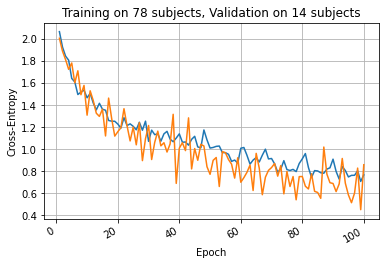

In [56]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

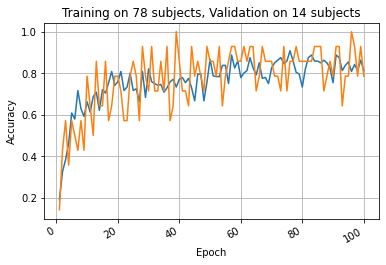

In [54]:
fig, ax = plt.subplots()
plot_accuracies(ax, train_losses, 'Training')
plot_accuracies(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [59]:
def replace_target_norm_layer_for_group_norm(model, target, desired, num_groups=8):
    for child_name, child in model.named_children():
        if isinstance(child, target):
            setattr(model, child_name, desired(num_groups=num_groups, num_channels=child.num_features))
        else:
            replace_target_norm_layer_for_group_norm(child, target, desired, num_groups)

In [60]:
exp_name = 'relative_patch_group_norm'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100
learning_rate = 1e-5

model = UnetEncoderSSL(normalization='instance')

# Replace InstanceNorm3D for GroupNorm

replace_target_norm_layer_for_group_norm(model, nn.InstanceNorm3d, nn.GroupNorm, num_groups=8)

model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 2.036	Accuracy: 0.14


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.915	Accuracy: 0.50
Starting epoch 2


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.866	Accuracy: 0.35


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.905	Accuracy: 0.50
Starting epoch 3


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.760	Accuracy: 0.53


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.654	Accuracy: 0.64
Starting epoch 4


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.698	Accuracy: 0.55


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.507	Accuracy: 0.64
Starting epoch 5


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.692	Accuracy: 0.48


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.579	Accuracy: 0.57
Starting epoch 6


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.559	Accuracy: 0.55


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.298	Accuracy: 0.86
Starting epoch 7


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.484	Accuracy: 0.71


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.279	Accuracy: 0.79
Starting epoch 8


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.475	Accuracy: 0.65


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.446	Accuracy: 0.71
Starting epoch 9


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.505	Accuracy: 0.57


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.242	Accuracy: 0.86
Starting epoch 10


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.502	Accuracy: 0.60


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.399	Accuracy: 0.57
Starting epoch 11


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.464	Accuracy: 0.68


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.229	Accuracy: 0.71
Starting epoch 12


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.470	Accuracy: 0.60


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.111	Accuracy: 0.86
Starting epoch 13


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.390	Accuracy: 0.62


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.132	Accuracy: 0.93
Starting epoch 14


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.388	Accuracy: 0.64


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.260	Accuracy: 0.86
Starting epoch 15


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.381	Accuracy: 0.65


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.460	Accuracy: 0.64
Starting epoch 16


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.348	Accuracy: 0.65


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.381	Accuracy: 0.71
Starting epoch 17


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.319	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.567	Accuracy: 0.57
Starting epoch 18


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.288	Accuracy: 0.64


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.075	Accuracy: 0.79
Starting epoch 19


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.328	Accuracy: 0.68


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.255	Accuracy: 0.79
Starting epoch 20


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.236	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.859	Accuracy: 1.00
Starting epoch 21


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.184	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.196	Accuracy: 0.71
Starting epoch 22


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.320	Accuracy: 0.68


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.177	Accuracy: 0.64
Starting epoch 23


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.190	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.255	Accuracy: 0.64
Starting epoch 24


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.212	Accuracy: 0.65


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.471	Accuracy: 0.43
Starting epoch 25


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.244	Accuracy: 0.68


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.138	Accuracy: 0.79
Starting epoch 26


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.122	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.170	Accuracy: 0.79
Starting epoch 27


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.193	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.181	Accuracy: 0.57
Starting epoch 28


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.191	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.304	Accuracy: 0.64
Starting epoch 29


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.164	Accuracy: 0.72


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.154	Accuracy: 0.86
Starting epoch 30


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.128	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.068	Accuracy: 0.71
Starting epoch 31


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.255	Accuracy: 0.71


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.943	Accuracy: 1.00
Starting epoch 32


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.211	Accuracy: 0.70


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.050	Accuracy: 0.79
Starting epoch 33


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.224	Accuracy: 0.68


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.808	Accuracy: 0.79
Starting epoch 34


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.145	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.141	Accuracy: 0.71
Starting epoch 35


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.099	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.003	Accuracy: 0.86
Starting epoch 36


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.168	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.092	Accuracy: 0.71
Starting epoch 37


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.063	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.189	Accuracy: 0.57
Starting epoch 38


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.084	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.002	Accuracy: 0.86
Starting epoch 39


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.005	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.082	Accuracy: 0.79
Starting epoch 40


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.993	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.870	Accuracy: 0.86
Starting epoch 41


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.125	Accuracy: 0.71


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.907	Accuracy: 0.79
Starting epoch 42


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.087	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.943	Accuracy: 0.79
Starting epoch 43


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.014	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.001	Accuracy: 0.86
Starting epoch 44


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.102	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.824	Accuracy: 0.86
Starting epoch 45


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.142	Accuracy: 0.70


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.233	Accuracy: 0.71
Starting epoch 46


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.053	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.838	Accuracy: 0.86
Starting epoch 47


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.098	Accuracy: 0.67


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.020	Accuracy: 0.71
Starting epoch 48


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.051	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.900	Accuracy: 0.86
Starting epoch 49


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.949	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.169	Accuracy: 0.71
Starting epoch 50


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.011	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.823	Accuracy: 0.71
Starting epoch 51


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.055	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.817	Accuracy: 0.93
Starting epoch 52


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.964	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.993	Accuracy: 0.71
Starting epoch 53


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.031	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.177	Accuracy: 0.71
Starting epoch 54


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.025	Accuracy: 0.76


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.859	Accuracy: 0.79
Starting epoch 55


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.018	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.019	Accuracy: 0.79
Starting epoch 56


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.007	Accuracy: 0.77


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.770	Accuracy: 0.71
Starting epoch 57


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.972	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.743	Accuracy: 0.93
Starting epoch 58


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.894	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.051	Accuracy: 0.64
Starting epoch 59


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.918	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.802	Accuracy: 0.86
Starting epoch 60


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.128	Accuracy: 0.67


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.635	Accuracy: 0.86
Starting epoch 61


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.079	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.915	Accuracy: 0.71
Starting epoch 62


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.953	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.717	Accuracy: 0.86
Starting epoch 63


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.960	Accuracy: 0.77


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.845	Accuracy: 0.86
Starting epoch 64


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.996	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.984	Accuracy: 0.64
Starting epoch 65


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.950	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.770	Accuracy: 0.71
Starting epoch 66


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.949	Accuracy: 0.77


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.908	Accuracy: 0.86
Starting epoch 67


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.793	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.039	Accuracy: 0.64
Starting epoch 68


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.926	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.882	Accuracy: 0.71
Starting epoch 69


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.012	Accuracy: 0.73


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.892	Accuracy: 0.86
Starting epoch 70


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.958	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.028	Accuracy: 0.79
Starting epoch 71


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.920	Accuracy: 0.79


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.700	Accuracy: 0.86
Starting epoch 72


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.856	Accuracy: 0.84


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.952	Accuracy: 0.71
Starting epoch 73


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.834	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.863	Accuracy: 0.79
Starting epoch 74


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.869	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.343	Accuracy: 0.50
Starting epoch 75


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 1.008	Accuracy: 0.75


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.781	Accuracy: 0.79
Starting epoch 76


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.903	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.634	Accuracy: 0.93
Starting epoch 77


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.895	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.939	Accuracy: 0.64
Starting epoch 78


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.913	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.522	Accuracy: 1.00
Starting epoch 79


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.949	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.885	Accuracy: 0.79
Starting epoch 80


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.869	Accuracy: 0.81


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.837	Accuracy: 0.86
Starting epoch 81


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.817	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.525	Accuracy: 0.93
Starting epoch 82


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.882	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.802	Accuracy: 0.93
Starting epoch 83


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.805	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.573	Accuracy: 0.93
Starting epoch 84


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.854	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.702	Accuracy: 0.86
Starting epoch 85


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.832	Accuracy: 0.86


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.557	Accuracy: 0.93
Starting epoch 86


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.776	Accuracy: 0.88


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.074	Accuracy: 0.57
Starting epoch 87


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.807	Accuracy: 0.90


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.762	Accuracy: 0.93
Starting epoch 88


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.852	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.758	Accuracy: 0.64
Starting epoch 89


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.776	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.720	Accuracy: 0.86
Starting epoch 90


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.903	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.589	Accuracy: 0.93
Starting epoch 91


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.781	Accuracy: 0.83


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.707	Accuracy: 0.79
Starting epoch 92


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.913	Accuracy: 0.80


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.572	Accuracy: 0.93
Starting epoch 93


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.769	Accuracy: 0.90


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.583	Accuracy: 0.93
Starting epoch 94


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.876	Accuracy: 0.78


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.649	Accuracy: 0.93
Starting epoch 95


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.821	Accuracy: 0.82


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 1.013	Accuracy: 0.57
Starting epoch 96


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.698	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.610	Accuracy: 0.86
Starting epoch 97


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.764	Accuracy: 0.85


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.665	Accuracy: 0.79
Starting epoch 98


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.974	Accuracy: 0.74


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.488	Accuracy: 0.93
Starting epoch 99


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.754	Accuracy: 0.90


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.672	Accuracy: 0.79
Starting epoch 100


  0%|          | 0/10 [00:00<?, ?it/s]

Training mean loss: 0.699	Accuracy: 0.91


  0%|          | 0/1 [00:00<?, ?it/s]

Validation mean loss: 0.662	Accuracy: 0.79


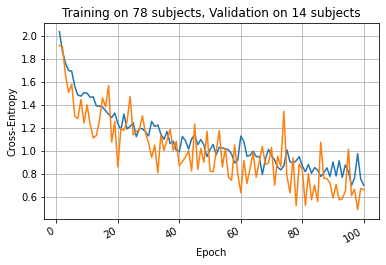

In [61]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

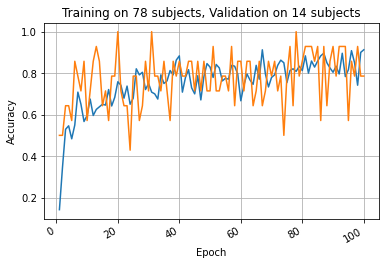

In [62]:
fig, ax = plt.subplots()
plot_accuracies(ax, train_losses, 'Training')
plot_accuracies(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [104]:
target_shape = (128, 128, 32)
max_displacement = (8, 8, 0)
num_control_points = 6

downsampling_factor = 2
original_spacing = 1
target_spacing = downsampling_factor / original_spacing  # in mm

patch_dim = 28
gap = 14


transforms = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    tio.RandomFlip(axes=(0, 1, 2), p=0.5),
    tio.OneOf({
        tio.RandomAnisotropy(): 0.5,
        tio.RandomBlur(): 0.5,
        tio.RandomNoise(): 0.5,  
    }, p=0.5),
    tio.OneOf({
        tio.RandomAffine(): 0.5,
        tio.RandomElasticDeformation(max_displacement=max_displacement): 0.5,
        tio.RandomElasticDeformation(
            max_displacement=max_displacement,
            num_control_points=num_control_points
        ): 0.5,
        tio.RandomMotion(num_transforms=4, image_interpolation='linear'): 0.5
    }, p=0.8)
])

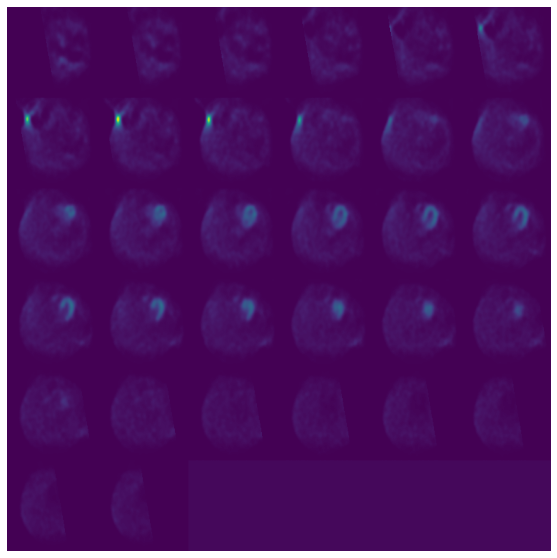

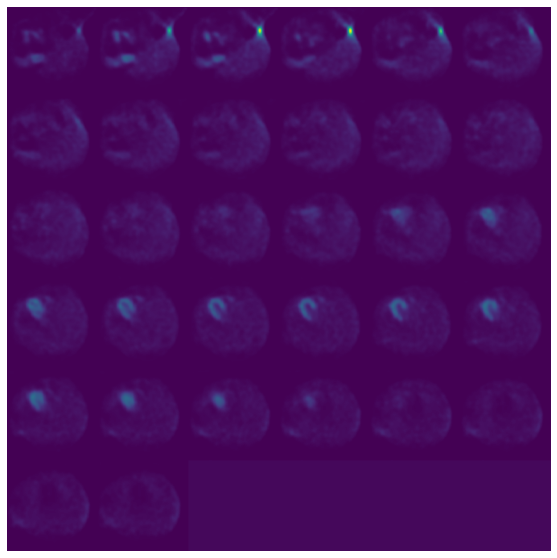

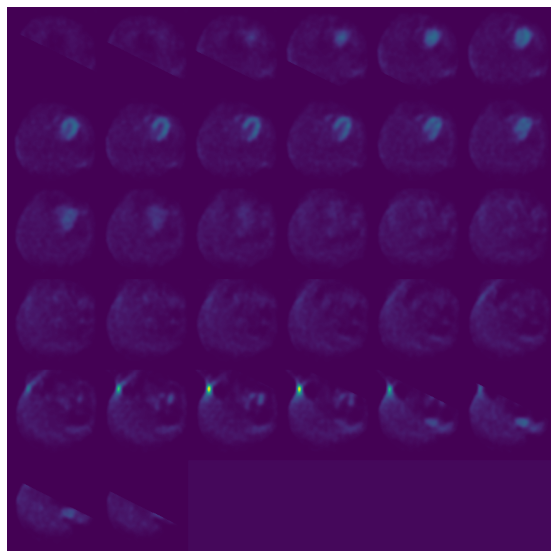

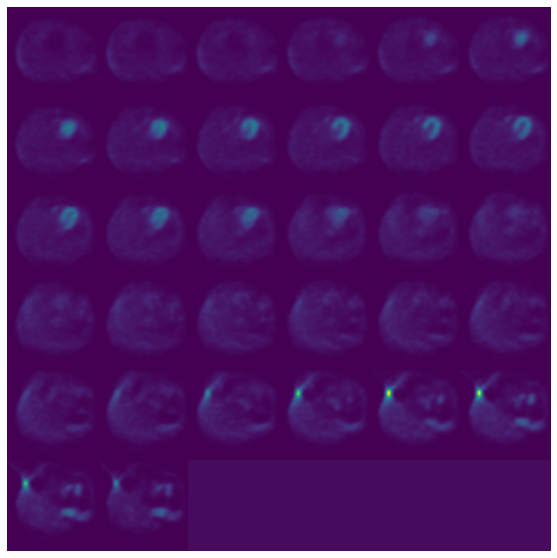

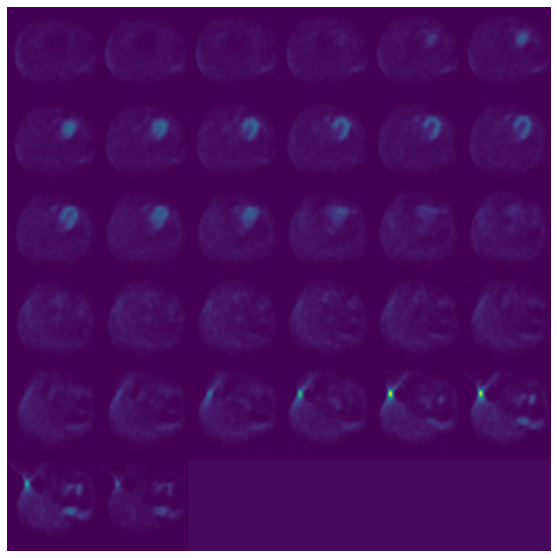

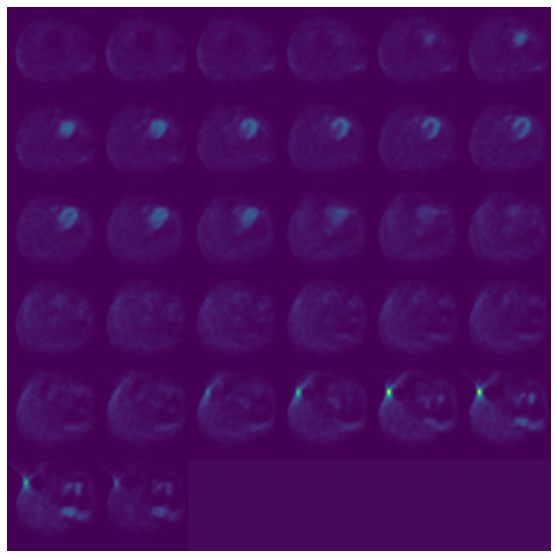

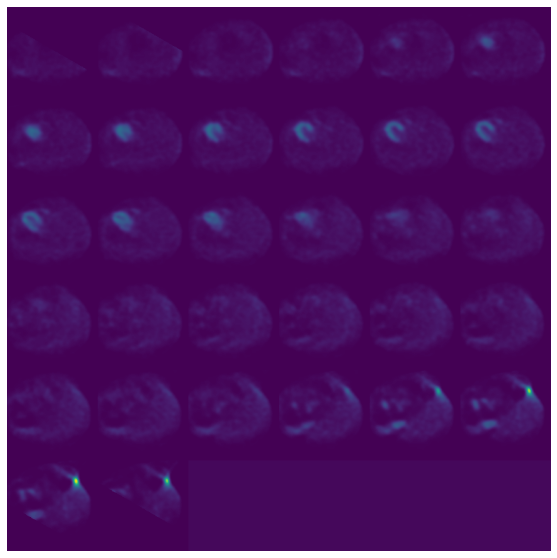

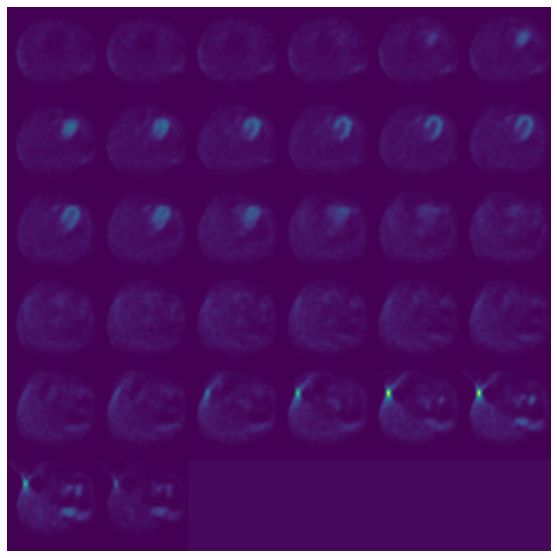

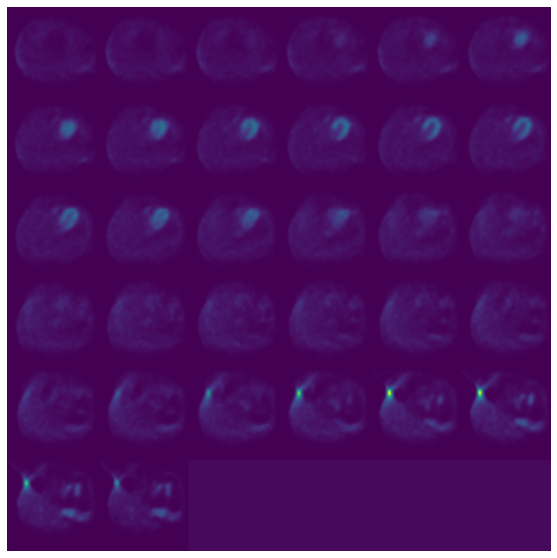

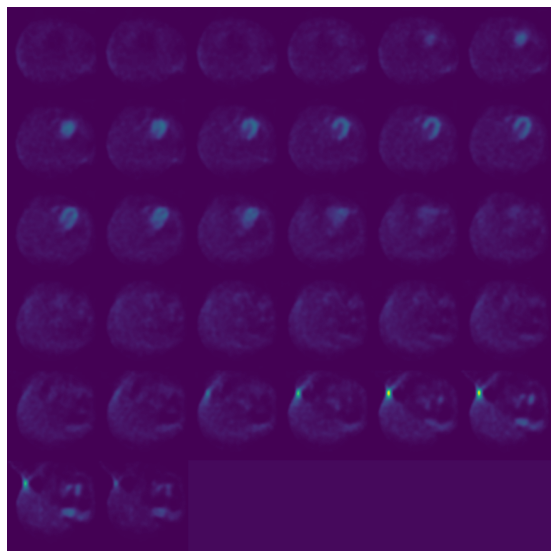

In [105]:
for i in range(10):
    
    transformed_subject = transforms(subjects[10])
    
    image_transformed = transformed_subject.spect.data.numpy()

    vis.visualize(
        np.squeeze(image_transformed).swapaxes(1, 2).swapaxes(0, 1), 
    )

In [54]:
target_shape = (128, 128, 32)
max_displacement = (8, 8, 0)
num_control_points = 10

downsampling_factor = 3
original_spacing = 1
target_spacing = downsampling_factor / original_spacing  # in mm

patch_dim = 28
gap = 14


training_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    tio.RandomFlip(axes=(0, 1, 2), p=0.5),
    tio.OneOf({
        tio.RandomAnisotropy(): 0.5,
        tio.RandomBlur(): 0.5,
        tio.RandomNoise(): 0.5,  
    }, p=0.5),
    tio.OneOf({
        tio.RandomAffine(): 0.5,
        tio.RandomElasticDeformation(max_displacement=max_displacement): 0.5,
        tio.RandomElasticDeformation(
            max_displacement=max_displacement,
            num_control_points=num_control_points
        ): 0.5,
        tio.RandomMotion(num_transforms=4, image_interpolation='linear'): 0.5
    }, p=0.8),
    GetPatches(patch_dim, gap),
    NormalizePatches()
])

validation_transform = tio.Compose([
    tio.CropOrPad(target_shape=target_shape),
    GetPatches(patch_dim, gap),
    NormalizePatches()
])

In [56]:
training_split_ratio = 0.7

num_subjects = len(dataset)

num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = (num_training_subjects, num_validation_subjects)
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

print('Training set:', len(training_set), 'subjects')
print('Validation set:', len(validation_set), 'subjects')

Training set: 64 subjects
Validation set: 28 subjects


In [57]:
training_batch_size = 8
validation_batch_size = 2 * training_batch_size

training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=training_batch_size,
    shuffle=True,
    num_workers=0,
)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=validation_batch_size,
    num_workers=0,
)

In [116]:
exp_name = 'relative_patch_instance_norm_aug'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100
learning_rate = 1e-5

model = UnetEncoderSSL(normalization='instance')
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 2.041	Accuracy: 0.22


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 2.067	Accuracy: 0.23
Starting epoch 2


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.953	Accuracy: 0.30


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.946	Accuracy: 0.32
Starting epoch 3


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.996	Accuracy: 0.23


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.831	Accuracy: 0.34
Starting epoch 4


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.818	Accuracy: 0.42


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.687	Accuracy: 0.54
Starting epoch 5


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.748	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.720	Accuracy: 0.61
Starting epoch 6


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.760	Accuracy: 0.50


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.694	Accuracy: 0.40
Starting epoch 7


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.718	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.605	Accuracy: 0.50
Starting epoch 8


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.642	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.511	Accuracy: 0.56
Starting epoch 9


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.629	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.587	Accuracy: 0.49
Starting epoch 10


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.560	Accuracy: 0.58


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.528	Accuracy: 0.56
Starting epoch 11


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.568	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.420	Accuracy: 0.55
Starting epoch 12


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.519	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.419	Accuracy: 0.60
Starting epoch 13


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.497	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.338	Accuracy: 0.73
Starting epoch 14


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.591	Accuracy: 0.47


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.337	Accuracy: 0.66
Starting epoch 15


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.418	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.352	Accuracy: 0.62
Starting epoch 16


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.399	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.291	Accuracy: 0.69
Starting epoch 17


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.433	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.349	Accuracy: 0.69
Starting epoch 18


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.399	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.275	Accuracy: 0.72
Starting epoch 19


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.425	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.261	Accuracy: 0.73
Starting epoch 20


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.459	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.416	Accuracy: 0.61
Starting epoch 21


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.483	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.223	Accuracy: 0.67
Starting epoch 22


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.425	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.291	Accuracy: 0.69
Starting epoch 23


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.377	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.310	Accuracy: 0.69
Starting epoch 24


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.319	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.342	Accuracy: 0.51
Starting epoch 25


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.357	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.435	Accuracy: 0.61
Starting epoch 26


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.384	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.025	Accuracy: 0.80
Starting epoch 27


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.337	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.204	Accuracy: 0.72
Starting epoch 28


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.226	Accuracy: 0.80


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.278	Accuracy: 0.60
Starting epoch 29


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.315	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.066	Accuracy: 0.79
Starting epoch 30


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.350	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.096	Accuracy: 0.75
Starting epoch 31


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.332	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.066	Accuracy: 0.80
Starting epoch 32


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.341	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.028	Accuracy: 0.83
Starting epoch 33


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.378	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.141	Accuracy: 0.70
Starting epoch 34


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.319	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.198	Accuracy: 0.70
Starting epoch 35


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.331	Accuracy: 0.66


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.190	Accuracy: 0.62
Starting epoch 36


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.317	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.220	Accuracy: 0.65
Starting epoch 37


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.273	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.181	Accuracy: 0.72
Starting epoch 38


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.228	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.200	Accuracy: 0.74
Starting epoch 39


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.337	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.138	Accuracy: 0.65
Starting epoch 40


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.257	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.031	Accuracy: 0.82
Starting epoch 41


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.217	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.968	Accuracy: 0.79
Starting epoch 42


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.307	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.980	Accuracy: 0.78
Starting epoch 43


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.311	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.967	Accuracy: 0.83
Starting epoch 44


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.272	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.907	Accuracy: 0.83
Starting epoch 45


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.238	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.072	Accuracy: 0.71
Starting epoch 46


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.237	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.038	Accuracy: 0.79
Starting epoch 47


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.217	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.053	Accuracy: 0.73
Starting epoch 48


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.193	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.997	Accuracy: 0.78
Starting epoch 49


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.268	Accuracy: 0.66


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.165	Accuracy: 0.73
Starting epoch 50


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.169	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.177	Accuracy: 0.57
Starting epoch 51


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.236	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.112	Accuracy: 0.62
Starting epoch 52


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.201	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.065	Accuracy: 0.74
Starting epoch 53


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.118	Accuracy: 0.78


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.055	Accuracy: 0.71
Starting epoch 54


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.221	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.828	Accuracy: 0.88
Starting epoch 55


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.120	Accuracy: 0.67


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.891	Accuracy: 0.84
Starting epoch 56


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.237	Accuracy: 0.67


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.986	Accuracy: 0.75
Starting epoch 57


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.218	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.179	Accuracy: 0.69
Starting epoch 58


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.118	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.129	Accuracy: 0.75
Starting epoch 59


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.166	Accuracy: 0.66


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.989	Accuracy: 0.70
Starting epoch 60


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.093	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.006	Accuracy: 0.66
Starting epoch 61


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.282	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.965	Accuracy: 0.74
Starting epoch 62


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.184	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.774	Accuracy: 0.82
Starting epoch 63


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.155	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.709	Accuracy: 0.91
Starting epoch 64


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.187	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.883	Accuracy: 0.76
Starting epoch 65


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.283	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.018	Accuracy: 0.67
Starting epoch 66


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.228	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.876	Accuracy: 0.62
Starting epoch 67


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.087	Accuracy: 0.77


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.971	Accuracy: 0.72
Starting epoch 68


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.195	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.803	Accuracy: 0.83
Starting epoch 69


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.167	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.868	Accuracy: 0.80
Starting epoch 70


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.174	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.909	Accuracy: 0.75
Starting epoch 71


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.036	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.919	Accuracy: 0.79
Starting epoch 72


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.214	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.818	Accuracy: 0.71
Starting epoch 73


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.094	Accuracy: 0.77


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.036	Accuracy: 0.69
Starting epoch 74


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.122	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.045	Accuracy: 0.65
Starting epoch 75


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.290	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.115	Accuracy: 0.70
Starting epoch 76


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.042	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.933	Accuracy: 0.80
Starting epoch 77


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.022	Accuracy: 0.84


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.989	Accuracy: 0.70
Starting epoch 78


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.029	Accuracy: 0.78


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.874	Accuracy: 0.76
Starting epoch 79


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.135	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.818	Accuracy: 0.82
Starting epoch 80


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.082	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.088	Accuracy: 0.66
Starting epoch 81


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.092	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.795	Accuracy: 0.91
Starting epoch 82


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.093	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.972	Accuracy: 0.71
Starting epoch 83


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.104	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.948	Accuracy: 0.75
Starting epoch 84


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.061	Accuracy: 0.80


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.917	Accuracy: 0.77
Starting epoch 85


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.144	Accuracy: 0.67


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.823	Accuracy: 0.82
Starting epoch 86


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.185	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.858	Accuracy: 0.76
Starting epoch 87


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.216	Accuracy: 0.67


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.962	Accuracy: 0.78
Starting epoch 88


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.019	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.807	Accuracy: 0.75
Starting epoch 89


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.038	Accuracy: 0.81


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.907	Accuracy: 0.86
Starting epoch 90


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.026	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.776	Accuracy: 0.84
Starting epoch 91


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.251	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.857	Accuracy: 0.66
Starting epoch 92


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.086	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.944	Accuracy: 0.69
Starting epoch 93


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.059	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.808	Accuracy: 0.71
Starting epoch 94


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.067	Accuracy: 0.75


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.974	Accuracy: 0.71
Starting epoch 95


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.135	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.022	Accuracy: 0.66
Starting epoch 96


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.038	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.945	Accuracy: 0.80
Starting epoch 97


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.014	Accuracy: 0.70


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.743	Accuracy: 0.91
Starting epoch 98


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.138	Accuracy: 0.72


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.768	Accuracy: 0.76
Starting epoch 99


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.072	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.825	Accuracy: 0.66
Starting epoch 100


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 0.985	Accuracy: 0.77


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.951	Accuracy: 0.76


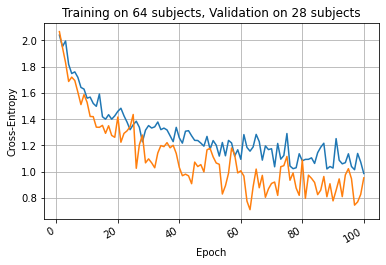

In [117]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

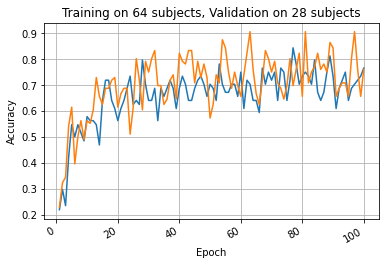

In [119]:
fig, ax = plt.subplots()
plot_accuracies(ax, train_losses, 'Training')
plot_accuracies(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Accuracy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

## Add dropout

In [60]:
exp_name = 'relative_patch_instance_norm_aug_dropout'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100
learning_rate = 1e-5

model = UnetEncoderSSL(normalization='instance', dropout=0.3)
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}

# Saving in run_epoch when best validation accuracy occures

torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 2.124	Accuracy: 0.09


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 2.125	Accuracy: 0.11
Starting epoch 2


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 2.106	Accuracy: 0.14


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 2.022	Accuracy: 0.19
Starting epoch 3


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 2.047	Accuracy: 0.23


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 2.061	Accuracy: 0.19
Starting epoch 4


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.978	Accuracy: 0.28


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.961	Accuracy: 0.30
Starting epoch 5


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 2.057	Accuracy: 0.12


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.861	Accuracy: 0.44
Starting epoch 6


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.981	Accuracy: 0.30


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.952	Accuracy: 0.27
Starting epoch 7


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.899	Accuracy: 0.39


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.885	Accuracy: 0.32
Starting epoch 8


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.954	Accuracy: 0.22


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.849	Accuracy: 0.42
Starting epoch 9


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.903	Accuracy: 0.36


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.929	Accuracy: 0.42
Starting epoch 10


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.861	Accuracy: 0.41


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.801	Accuracy: 0.41
Starting epoch 11


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.802	Accuracy: 0.39


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.730	Accuracy: 0.52
Starting epoch 12


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.839	Accuracy: 0.39


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.783	Accuracy: 0.47
Starting epoch 13


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.765	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.694	Accuracy: 0.45
Starting epoch 14


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.820	Accuracy: 0.39


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.738	Accuracy: 0.40
Starting epoch 15


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.761	Accuracy: 0.42


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.612	Accuracy: 0.58
Starting epoch 16


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.796	Accuracy: 0.44


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.621	Accuracy: 0.56
Starting epoch 17


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.780	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.569	Accuracy: 0.61
Starting epoch 18


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.790	Accuracy: 0.44


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.611	Accuracy: 0.53
Starting epoch 19


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.717	Accuracy: 0.41


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.601	Accuracy: 0.56
Starting epoch 20


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.709	Accuracy: 0.41


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.702	Accuracy: 0.48
Starting epoch 21


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.783	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.551	Accuracy: 0.60
Starting epoch 22


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.702	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.446	Accuracy: 0.59
Starting epoch 23


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.703	Accuracy: 0.44


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.401	Accuracy: 0.65
Starting epoch 24


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.681	Accuracy: 0.50


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.422	Accuracy: 0.60
Starting epoch 25


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.665	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.541	Accuracy: 0.52
Starting epoch 26


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.634	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.465	Accuracy: 0.62
Starting epoch 27


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.657	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.390	Accuracy: 0.62
Starting epoch 28


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.621	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.479	Accuracy: 0.49
Starting epoch 29


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.633	Accuracy: 0.47


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.518	Accuracy: 0.54
Starting epoch 30


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.625	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.408	Accuracy: 0.57
Starting epoch 31


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.654	Accuracy: 0.53


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.295	Accuracy: 0.76
Starting epoch 32


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.615	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.384	Accuracy: 0.58
Starting epoch 33


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.720	Accuracy: 0.34


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.452	Accuracy: 0.61
Starting epoch 34


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.573	Accuracy: 0.47


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.241	Accuracy: 0.68
Starting epoch 35


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.588	Accuracy: 0.50


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.233	Accuracy: 0.70
Starting epoch 36


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.664	Accuracy: 0.47


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.232	Accuracy: 0.64
Starting epoch 37


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.588	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.335	Accuracy: 0.69
Starting epoch 38


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.580	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.293	Accuracy: 0.74
Starting epoch 39


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.556	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.185	Accuracy: 0.70
Starting epoch 40


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.419	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.537	Accuracy: 0.44
Starting epoch 41


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.629	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.345	Accuracy: 0.60
Starting epoch 42


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.527	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.439	Accuracy: 0.57
Starting epoch 43


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.609	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.310	Accuracy: 0.57
Starting epoch 44


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.608	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.331	Accuracy: 0.61
Starting epoch 45


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.517	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.370	Accuracy: 0.60
Starting epoch 46


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.518	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.291	Accuracy: 0.57
Starting epoch 47


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.435	Accuracy: 0.58


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.435	Accuracy: 0.51
Starting epoch 48


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.549	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.339	Accuracy: 0.62
Starting epoch 49


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.558	Accuracy: 0.47


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.264	Accuracy: 0.64
Starting epoch 50


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.416	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.130	Accuracy: 0.69
Starting epoch 51


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.491	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.146	Accuracy: 0.60
Starting epoch 52


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.469	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.216	Accuracy: 0.58
Starting epoch 53


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.459	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.006	Accuracy: 0.78
Starting epoch 54


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.402	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.201	Accuracy: 0.70
Starting epoch 55


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.434	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.203	Accuracy: 0.61
Starting epoch 56


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.425	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.178	Accuracy: 0.66
Starting epoch 57


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.409	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.117	Accuracy: 0.73
Starting epoch 58


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.416	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.151	Accuracy: 0.69
Starting epoch 59


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.308	Accuracy: 0.69


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.157	Accuracy: 0.64
Starting epoch 60


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.497	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.125	Accuracy: 0.69
Starting epoch 61


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.415	Accuracy: 0.58


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.036	Accuracy: 0.83
Starting epoch 62


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.465	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.985	Accuracy: 0.73
Starting epoch 63


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.340	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.052	Accuracy: 0.79
Starting epoch 64


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.349	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.259	Accuracy: 0.65
Starting epoch 65


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.463	Accuracy: 0.50


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.209	Accuracy: 0.61
Starting epoch 66


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.392	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.190	Accuracy: 0.67
Starting epoch 67


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.470	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.051	Accuracy: 0.61
Starting epoch 68


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.486	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.307	Accuracy: 0.47
Starting epoch 69


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.363	Accuracy: 0.66


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.078	Accuracy: 0.67
Starting epoch 70


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.529	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.318	Accuracy: 0.58
Starting epoch 71


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.419	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.174	Accuracy: 0.68
Starting epoch 72


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.281	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.168	Accuracy: 0.61
Starting epoch 73


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.414	Accuracy: 0.48


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.059	Accuracy: 0.72
Starting epoch 74


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.481	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.135	Accuracy: 0.59
Starting epoch 75


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.483	Accuracy: 0.45


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.105	Accuracy: 0.71
Starting epoch 76


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.271	Accuracy: 0.66


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.991	Accuracy: 0.83
Starting epoch 77


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.283	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.978	Accuracy: 0.75
Starting epoch 78


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.436	Accuracy: 0.56


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.061	Accuracy: 0.78
Starting epoch 79


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.508	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.947	Accuracy: 0.76
Starting epoch 80


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.349	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.088	Accuracy: 0.66
Starting epoch 81


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.288	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.945	Accuracy: 0.77
Starting epoch 82


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.404	Accuracy: 0.52


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.231	Accuracy: 0.57
Starting epoch 83


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.404	Accuracy: 0.53


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.070	Accuracy: 0.64
Starting epoch 84


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.418	Accuracy: 0.53


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.211	Accuracy: 0.61
Starting epoch 85


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.322	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.230	Accuracy: 0.67
Starting epoch 86


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.301	Accuracy: 0.58


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.910	Accuracy: 0.75
Starting epoch 87


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.201	Accuracy: 0.73


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.218	Accuracy: 0.61
Starting epoch 88


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.223	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.125	Accuracy: 0.59
Starting epoch 89


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.488	Accuracy: 0.50


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.888	Accuracy: 0.79
Starting epoch 90


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.311	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.085	Accuracy: 0.70
Starting epoch 91


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.334	Accuracy: 0.55


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.018	Accuracy: 0.72
Starting epoch 92


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.269	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.906	Accuracy: 0.82
Starting epoch 93


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.202	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.946	Accuracy: 0.74
Starting epoch 94


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.293	Accuracy: 0.58


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.119	Accuracy: 0.65
Starting epoch 95


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.301	Accuracy: 0.67


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.048	Accuracy: 0.65
Starting epoch 96


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.291	Accuracy: 0.61


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.063	Accuracy: 0.69
Starting epoch 97


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.297	Accuracy: 0.59


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.052	Accuracy: 0.72
Starting epoch 98


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.234	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.951	Accuracy: 0.69
Starting epoch 99


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.238	Accuracy: 0.64


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 1.064	Accuracy: 0.64
Starting epoch 100


  0%|          | 0/8 [00:00<?, ?it/s]

Training mean loss: 1.223	Accuracy: 0.62


  0%|          | 0/2 [00:00<?, ?it/s]

Validation mean loss: 0.962	Accuracy: 0.69


## InstanceNorm + Dropout

In [12]:
exp_name = 'relative_patch'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100

model = UnetEncoderSSL(normalization='instance', dropout=0.3)
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters())
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
#torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 11.093


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.753
Starting epoch 2


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 8.474


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 11.024
Starting epoch 3


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 9.119


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 10.167
Starting epoch 4


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 9.099


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.225
Starting epoch 5


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.853


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 8.227
Starting epoch 6


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 8.328


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 9.707
Starting epoch 7


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.841


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.032
Starting epoch 8


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.968


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.834
Starting epoch 9


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 9.209


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.498
Starting epoch 10


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.414


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.740
Starting epoch 11


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.613


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.735
Starting epoch 12


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.462


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.730
Starting epoch 13


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.383


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.930
Starting epoch 14


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.861


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.790
Starting epoch 15


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.826


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.090
Starting epoch 16


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.280


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.028
Starting epoch 17


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.129


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.688
Starting epoch 18


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.868


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.960
Starting epoch 19


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.068


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.384
Starting epoch 20


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.452


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.442
Starting epoch 21


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.467


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.831
Starting epoch 22


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.429


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.383
Starting epoch 23


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.693


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.242
Starting epoch 24


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.159


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.742
Starting epoch 25


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.637


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.787
Starting epoch 26


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.693


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.615
Starting epoch 27


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.459


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.838
Starting epoch 28


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.922


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.377
Starting epoch 29


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.250


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.298
Starting epoch 30


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.715


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.094
Starting epoch 31


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.748


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.037
Starting epoch 32


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.368


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.630
Starting epoch 33


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.526


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.033
Starting epoch 34


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.324


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.698
Starting epoch 35


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.168


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.246
Starting epoch 36


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.205


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.635
Starting epoch 37


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.740


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.932
Starting epoch 38


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.884


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.529
Starting epoch 39


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.381


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.024
Starting epoch 40


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.723


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.137
Starting epoch 41


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.751


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.368
Starting epoch 42


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.537


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.608
Starting epoch 43


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.950


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.489
Starting epoch 44


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.921


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.101
Starting epoch 45


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.939


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.172
Starting epoch 46


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.943


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.512
Starting epoch 47


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.941


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.288
Starting epoch 48


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.958


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.189
Starting epoch 49


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.914


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.683
Starting epoch 50


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.431


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.970
Starting epoch 51


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.875


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.373
Starting epoch 52


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.388


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 7.049
Starting epoch 53


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.956


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.380
Starting epoch 54


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.711


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.484
Starting epoch 55


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.763


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.641
Starting epoch 56


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.068


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.936
Starting epoch 57


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.797


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.510
Starting epoch 58


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.353


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.458
Starting epoch 59


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.220


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.059
Starting epoch 60


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.770


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.884
Starting epoch 61


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.311


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.611
Starting epoch 62


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.963


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 10.036
Starting epoch 63


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.936


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.855
Starting epoch 64


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.430


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.864
Starting epoch 65


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.467


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.767
Starting epoch 66


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 1.624


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.452
Starting epoch 67


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.405


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.500
Starting epoch 68


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.694


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.894
Starting epoch 69


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.204


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.396
Starting epoch 70


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.189


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.770
Starting epoch 71


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.819


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 7.001
Starting epoch 72


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.239


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.322
Starting epoch 73


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.640


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.857
Starting epoch 74


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.515


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.867
Starting epoch 75


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.209


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.088
Starting epoch 76


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.867


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.438
Starting epoch 77


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.833


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.144
Starting epoch 78


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.830


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.788
Starting epoch 79


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.944


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.022
Starting epoch 80


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.644


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.762
Starting epoch 81


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.618


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.718
Starting epoch 82


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.249


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.331
Starting epoch 83


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.571


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.066
Starting epoch 84


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.283


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.826
Starting epoch 85


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.179


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.557
Starting epoch 86


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.787


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.630
Starting epoch 87


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.020


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.471
Starting epoch 88


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.858


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.606
Starting epoch 89


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.799


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.571
Starting epoch 90


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.071


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.418
Starting epoch 91


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.191


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.254
Starting epoch 92


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.385


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.373
Starting epoch 93


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.026


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.141
Starting epoch 94


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.089


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.269
Starting epoch 95


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.789


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.963
Starting epoch 96


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.624


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.080
Starting epoch 97


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.468


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.044
Starting epoch 98


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.069


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.967
Starting epoch 99


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.492


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.682
Starting epoch 100


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.164


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.948


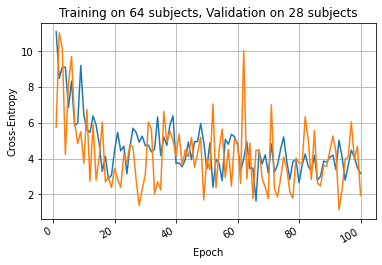

In [14]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [15]:
summary(model)

Layer (type:depth-idx)                                  Param #
UnetEncoderSSL                                          --
├─Encoder: 1-1                                          --
│    └─ModuleList: 2-1                                  --
│    │    └─EncodingBlock: 3-1                          3,682
│    │    └─EncodingBlock: 3-2                          20,738
├─Sequential: 1-2                                       --
│    └─Linear: 2-2                                      78,682,240
│    └─PReLU: 2-3                                       1
│    └─BatchNorm1d: 2-4                                 12,544
├─Sequential: 1-3                                       --
│    └─Linear: 2-5                                      100,360
Total params: 78,819,565
Trainable params: 78,819,565
Non-trainable params: 0

In [10]:
subjects = []

segmentations = list(df.loc[(df['mask'].isnull()), ['image']].to_records(index=False))
segmentations = list(map(
    lambda x: os.path.join(path_cropped, x[0]), 
    segmentations
))

for image_path in segmentations:

    subject = tio.Subject(spect=tio.ScalarImage(image_path, reader=load_image))
    subjects.append(subject)

dataset = tio.SubjectsDataset(subjects)
print(f"Dataset size: {len(dataset)} subjects")

Dataset size: 92 subjects


In [11]:
training_split_ratio = 0.7

num_subjects = len(dataset)

num_training_subjects = int(training_split_ratio * num_subjects)
num_validation_subjects = num_subjects - num_training_subjects

num_split_subjects = (num_training_subjects, num_validation_subjects)
training_subjects, validation_subjects = torch.utils.data.random_split(subjects, num_split_subjects)

training_set = tio.SubjectsDataset(training_subjects, transform=training_transform)
validation_set = tio.SubjectsDataset(validation_subjects, transform=validation_transform)

print('Training set:', len(training_set), 'subjects')
print('Validation set:', len(validation_set), 'subjects')

Training set: 64 subjects
Validation set: 28 subjects


In [12]:
training_batch_size = 2
validation_batch_size = 2 * training_batch_size

training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=training_batch_size,
    shuffle=True,
    num_workers=0,
)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=validation_batch_size,
    num_workers=0,
)

C:\Users\hkris\AppData\Local\Temp/ipykernel_22128/262732477.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 1, figsize=(10, 10))


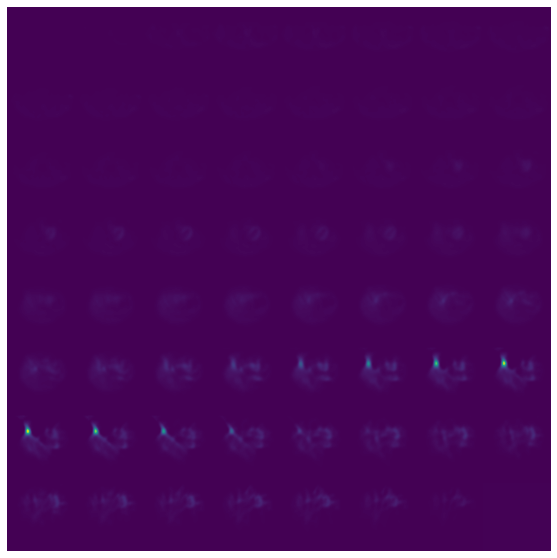

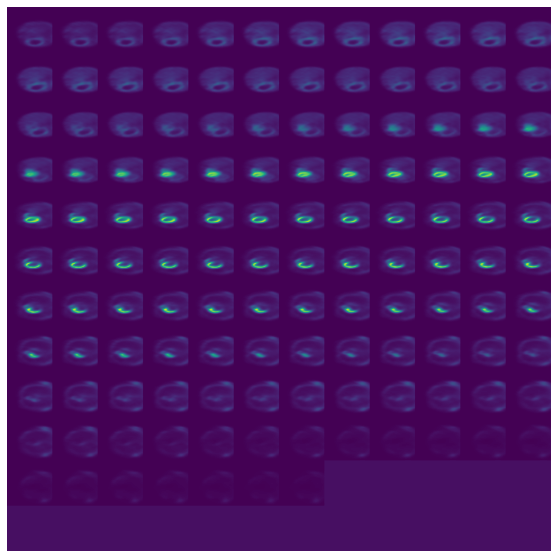

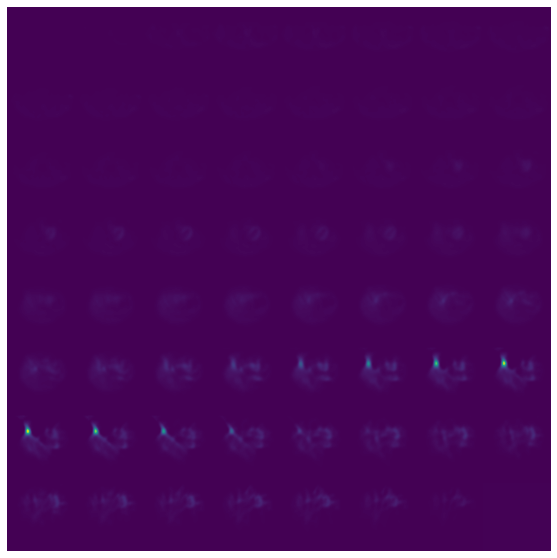

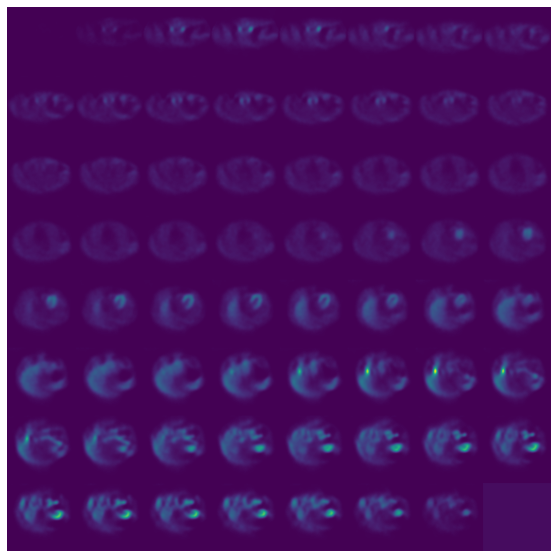

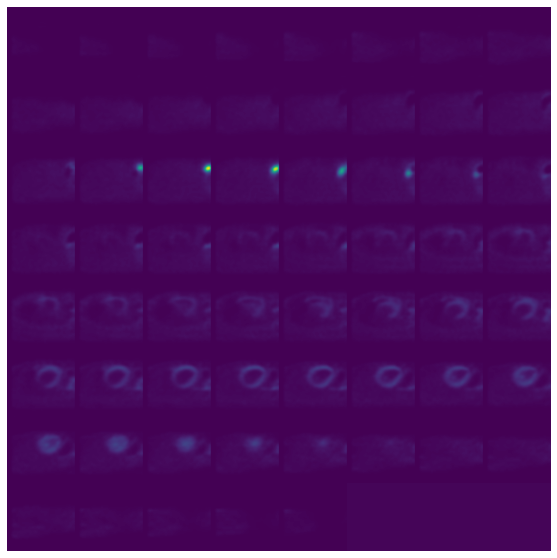

...

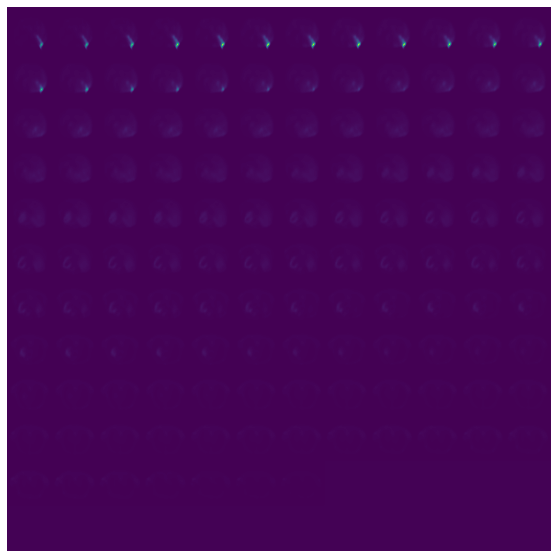

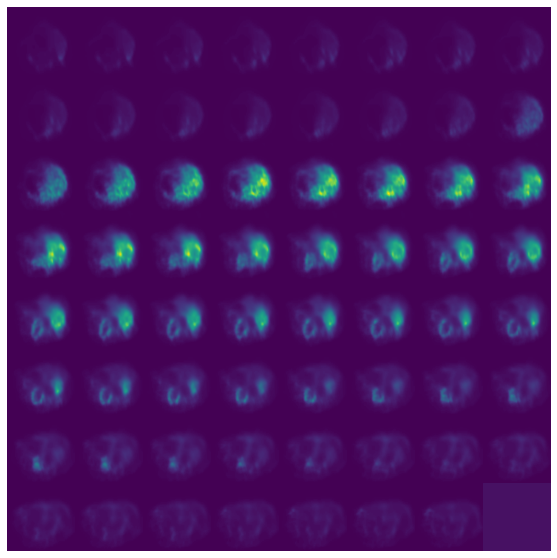

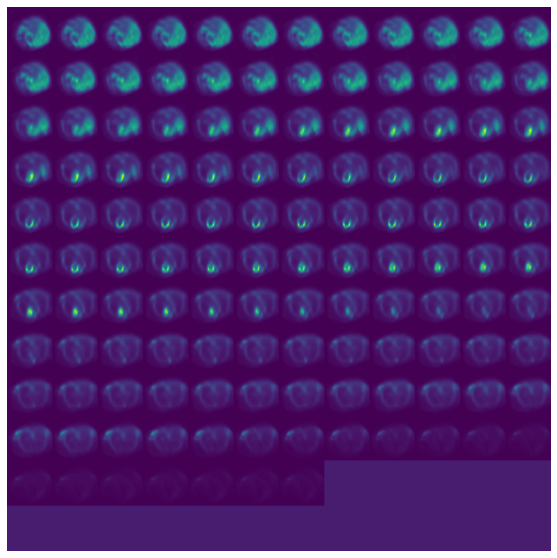

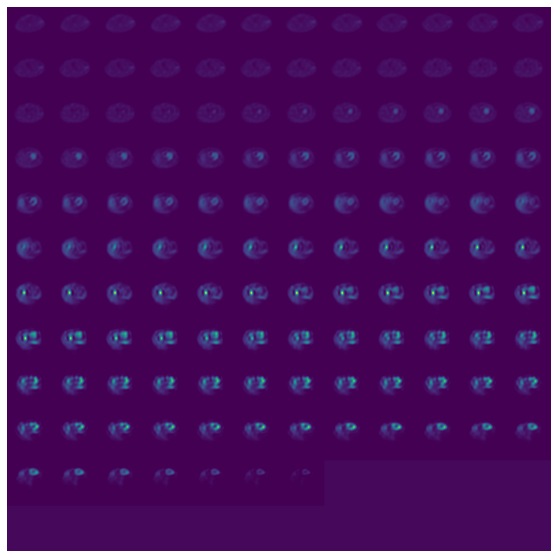

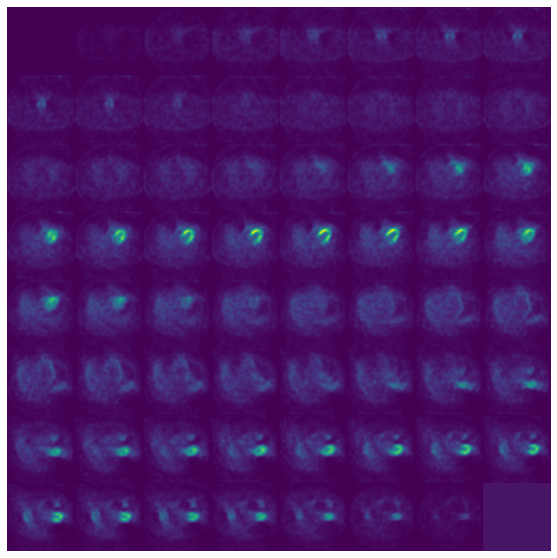

In [131]:
for subj in subjects:
    
    vis.visualize(subj.spect.data.permute(0, 3, 1, 2).squeeze(0).numpy())

In [13]:
exp_name = 'relative_patch'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100

model = UnetEncoderSSL(normalization='instance', dropout=0.3)
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters())
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
#torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 9.338


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.605
Starting epoch 2


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 9.281


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 8.225
Starting epoch 3


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.499


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 6.916
Starting epoch 4


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 7.345


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 7.226
Starting epoch 5


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 7.743


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.717
Starting epoch 6


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 8.112


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.622
Starting epoch 7


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 8.131


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.824
Starting epoch 8


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.207


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 7.716
Starting epoch 9


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.109


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.151
Starting epoch 10


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.480


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.252
Starting epoch 11


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.417


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.647
Starting epoch 12


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 8.694


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.462
Starting epoch 13


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.660


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.718
Starting epoch 14


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.522


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.740
Starting epoch 15


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.515


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.960
Starting epoch 16


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.064


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.438
Starting epoch 17


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.747


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.639
Starting epoch 18


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.517


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.124
Starting epoch 19


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.088


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.700
Starting epoch 20


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.580


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.959
Starting epoch 21


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.477


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.948
Starting epoch 22


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.444


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.282
Starting epoch 23


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.014


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.512
Starting epoch 24


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.299


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.677
Starting epoch 25


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.271


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.158
Starting epoch 26


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.977


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.796
Starting epoch 27


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.279


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.790
Starting epoch 28


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.667


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.696
Starting epoch 29


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.024


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.048
Starting epoch 30


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.200


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.288
Starting epoch 31


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.637


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.869
Starting epoch 32


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.422


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.922
Starting epoch 33


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.205


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.540
Starting epoch 34


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.121


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.610
Starting epoch 35


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.172


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.848
Starting epoch 36


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.958


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.013
Starting epoch 37


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.940


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.648
Starting epoch 38


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.738


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.233
Starting epoch 39


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.378


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.141
Starting epoch 40


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.366


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.753
Starting epoch 41


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.835


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.459
Starting epoch 42


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.737


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.319
Starting epoch 43


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.026


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.743
Starting epoch 44


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.589


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 9.310
Starting epoch 45


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.170


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.953
Starting epoch 46


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.686


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.613
Starting epoch 47


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.623


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.961
Starting epoch 48


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.701


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.376
Starting epoch 49


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.224


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.799
Starting epoch 50


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 1.987


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.929
Starting epoch 51


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 1.949


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.166
Starting epoch 52


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.971


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.104
Starting epoch 53


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.531


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.449
Starting epoch 54


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.891


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.085
Starting epoch 55


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.590


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.402
Starting epoch 56


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.617


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.624
Starting epoch 57


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.511


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.649
Starting epoch 58


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.904


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.361
Starting epoch 59


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.384


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 0.642
Starting epoch 60


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.747


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.168
Starting epoch 61


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.404


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.456
Starting epoch 62


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.965


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.133
Starting epoch 63


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.074


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.245
Starting epoch 64


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.994


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.382
Starting epoch 65


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.867


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.909
Starting epoch 66


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.763


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 0.757
Starting epoch 67


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.450


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.278
Starting epoch 68


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.295


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.722
Starting epoch 69


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.938


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.823
Starting epoch 70


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.827


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.544
Starting epoch 71


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.256


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.263
Starting epoch 72


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.623


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.800
Starting epoch 73


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.382


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.205
Starting epoch 74


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.651


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.220
Starting epoch 75


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.754


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.671
Starting epoch 76


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.771


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.178
Starting epoch 77


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.342


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.167
Starting epoch 78


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.621


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.056
Starting epoch 79


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.640


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 5.818
Starting epoch 80


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.614


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.781
Starting epoch 81


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.524


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.815
Starting epoch 82


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.521


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.233
Starting epoch 83


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.060


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.374
Starting epoch 84


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.288


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.661
Starting epoch 85


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.793


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 4.526
Starting epoch 86


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 6.339


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.284
Starting epoch 87


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.016


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.564
Starting epoch 88


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.587


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.475
Starting epoch 89


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.774


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.850
Starting epoch 90


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.355


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.881
Starting epoch 91


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.952


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.913
Starting epoch 92


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.860


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.430
Starting epoch 93


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.814


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.654
Starting epoch 94


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.713


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.390
Starting epoch 95


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 5.339


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 1.687
Starting epoch 96


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.692


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.738
Starting epoch 97


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.582


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.224
Starting epoch 98


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 3.765


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 2.523
Starting epoch 99


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 2.836


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.399
Starting epoch 100


  0%|          | 0/16 [00:00<?, ?it/s]

Training mean loss: 4.110


  0%|          | 0/4 [00:00<?, ?it/s]

Validation mean loss: 3.093


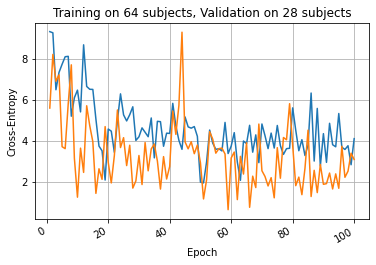

In [14]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [13]:
class UnetEncoderSSL(nn.Module):
    def __init__(
        self, 
        patch_dim_x=28,
        patch_dim_z = 32,
        num_encoding_blocks=3,
        out_channels_first_layer=8,
        normalization='batch', 
        dropout=0
    ):
        super().__init__()
        
        self.patch_dim_x = patch_dim_x
        self.patch_dim_z = patch_dim_z
        self.num_encoding_blocks = num_encoding_blocks
        self.normalization = normalization
        self.dropout = dropout
        
        self.encoder = UNet(
            in_channels=1,
            out_classes=2,
            dimensions=3,
            num_encoding_blocks=num_encoding_blocks,
            out_channels_first_layer=out_channels_first_layer,
            normalization=normalization,
            upsampling_type='linear',
            padding=True,
            activation='PReLU',
            dropout=dropout
        ).encoder

        dx = patch_dim_x // 2**(num_encoding_blocks - 1)
        dz = patch_dim_z // 2**(num_encoding_blocks - 1)
        n_in = (num_encoding_blocks + 1) * out_channels_first_layer * dx**2 * dz
        n_out = n_in // 8
        
        self.fc1 = nn.Sequential(
            nn.Linear(n_in, n_out),
            nn.PReLU(),
            nn.BatchNorm1d(n_out)
        )
        self.fc = nn.Sequential(
            nn.Linear(2 * n_out, n_out // 2),
            nn.PReLU(),
            nn.Linear(n_out // 2, 8)
        )
        
        
    def forward_once(self, x):
        
        skip_connections, output = self.encoder(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        
        return output
    
    def forward(self, input1, input2):
        
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output = torch.cat((output1, output2), dim=1)
        output = self.fc(output)
        
        return output

In [14]:
exp_name = 'relative_patch'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 100

model = UnetEncoderSSL(normalization='instance', dropout=0.3)
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters())
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
#torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 5.433


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 3.428
Starting epoch 2


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 4.538


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.376
Starting epoch 3


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 3.078


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.654
Starting epoch 4


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 3.214


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.987
Starting epoch 5


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.756


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.679
Starting epoch 6


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.228


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.352
Starting epoch 7


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.899


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.640
Starting epoch 8


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.546


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.108
Starting epoch 9


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.912


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.048
Starting epoch 10


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.841


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.517
Starting epoch 11


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.156


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.346
Starting epoch 12


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.093


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.985
Starting epoch 13


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.868


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.625
Starting epoch 14


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.055


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.605
Starting epoch 15


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.233


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.101
Starting epoch 16


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.051


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.849
Starting epoch 17


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.242


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.539
Starting epoch 18


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.978


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.028
Starting epoch 19


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.086


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.490
Starting epoch 20


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.709


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.894
Starting epoch 21


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.828


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.785
Starting epoch 22


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.809


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.544
Starting epoch 23


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.122


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.395
Starting epoch 24


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.985


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.970
Starting epoch 25


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.700


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.798
Starting epoch 26


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.129


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.562
Starting epoch 27


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.881


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.778
Starting epoch 28


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.136


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.626
Starting epoch 29


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.261


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.777
Starting epoch 30


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.159


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.992
Starting epoch 31


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.931


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.287
Starting epoch 32


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.772


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.081
Starting epoch 33


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.816


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.471
Starting epoch 34


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.837


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.201
Starting epoch 35


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.817


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.197
Starting epoch 36


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.769


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.295
Starting epoch 37


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.774


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.204
Starting epoch 38


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.837


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.587
Starting epoch 39


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.735


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.266
Starting epoch 40


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.510


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.946
Starting epoch 41


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.630


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.255
Starting epoch 42


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.689


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.435
Starting epoch 43


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.617


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.897
Starting epoch 44


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.829


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.085
Starting epoch 45


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.532


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.248
Starting epoch 46


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.825


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.218
Starting epoch 47


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.743


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.876
Starting epoch 48


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.719


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.667
Starting epoch 49


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.649


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.504
Starting epoch 50


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.021


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.487
Starting epoch 51


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.551


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.125
Starting epoch 52


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.597


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.390
Starting epoch 53


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.531


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.741
Starting epoch 54


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.580


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.010
Starting epoch 55


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.729


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.004
Starting epoch 56


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.605


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.120
Starting epoch 57


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.582


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.827
Starting epoch 58


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.610


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.553
Starting epoch 59


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.477


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.418
Starting epoch 60


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.423


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.877
Starting epoch 61


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.505


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.959
Starting epoch 62


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.606


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.420
Starting epoch 63


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.241


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.315
Starting epoch 64


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.454


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.762
Starting epoch 65


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.531


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.383
Starting epoch 66


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.552


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.288
Starting epoch 67


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.645


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.005
Starting epoch 68


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.549


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.192
Starting epoch 69


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.685


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.094
Starting epoch 70


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.553


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.128
Starting epoch 71


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.377


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.060
Starting epoch 72


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.632


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.147
Starting epoch 73


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.448


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.548
Starting epoch 74


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.652


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.090
Starting epoch 75


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.694


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.997
Starting epoch 76


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.560


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.087
Starting epoch 77


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.547


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.661
Starting epoch 78


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.361


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.809
Starting epoch 79


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.673


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.410
Starting epoch 80


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.574


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.262
Starting epoch 81


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.615


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.613
Starting epoch 82


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.594


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.291
Starting epoch 83


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.382


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.281
Starting epoch 84


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.114


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.963
Starting epoch 85


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.661


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.442
Starting epoch 86


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.432


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.561
Starting epoch 87


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.756


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.250
Starting epoch 88


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.481


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.616
Starting epoch 89


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.454


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.820
Starting epoch 90


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.594


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.157
Starting epoch 91


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.769


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.582
Starting epoch 92


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.732


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.186
Starting epoch 93


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.809


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.507
Starting epoch 94


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.637


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.623
Starting epoch 95


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.990


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.645
Starting epoch 96


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.635


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.461
Starting epoch 97


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.732


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.147
Starting epoch 98


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.764


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.536
Starting epoch 99


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.585


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.180
Starting epoch 100


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.505


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.357


In [20]:
summary(model)

Layer (type:depth-idx)                                  Param #
UnetEncoderSSL                                          --
├─Encoder: 1-1                                          --
│    └─ModuleList: 2-1                                  --
│    │    └─EncodingBlock: 3-1                          3,682
│    │    └─EncodingBlock: 3-2                          20,738
├─Sequential: 1-2                                       --
│    └─Linear: 2-2                                      19,670,560
│    └─PReLU: 2-3                                       1
│    └─BatchNorm1d: 2-4                                 3,136
├─Sequential: 1-3                                       --
│    └─Linear: 2-5                                      2,459,408
│    └─PReLU: 2-6                                       1
│    └─Linear: 2-7                                      6,280
Total params: 22,163,806
Trainable params: 22,163,806
Non-trainable params: 0

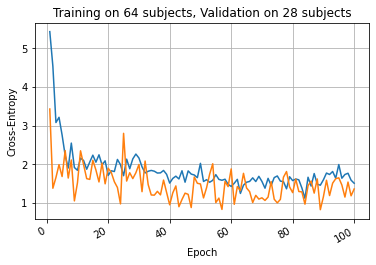

In [15]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [16]:
exp_name = 'relative_patch_instance_norm_dropout'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 300

model = UnetEncoderSSL(normalization='instance', dropout=0.3)
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters())
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 5.087


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.814
Starting epoch 2


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 5.031


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 3.737
Starting epoch 3


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 3.256


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.808
Starting epoch 4


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.970


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.024
Starting epoch 5


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.712


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.648
Starting epoch 6


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.716


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.962
Starting epoch 7


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.364


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.831
Starting epoch 8


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.452


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.797
Starting epoch 9


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.009


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.501
Starting epoch 10


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.320


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.510
Starting epoch 11


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.295


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.956
Starting epoch 12


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.323


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.775
Starting epoch 13


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.072


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.392
Starting epoch 14


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.323


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.255
Starting epoch 15


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.159


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.486
Starting epoch 16


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.535


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.923
Starting epoch 17


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.192


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.137
Starting epoch 18


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.224


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.690
Starting epoch 19


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.330


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.335
Starting epoch 20


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.161


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.893
Starting epoch 21


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.285


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.639
Starting epoch 22


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.947


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.866
Starting epoch 23


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.959


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.794
Starting epoch 24


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.752


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.990
Starting epoch 25


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.949


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.697
Starting epoch 26


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.039


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.988
Starting epoch 27


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.917


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.635
Starting epoch 28


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.937


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.999
Starting epoch 29


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.014


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.153
Starting epoch 30


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.987


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.175
Starting epoch 31


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.061


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.472
Starting epoch 32


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.911


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.944
Starting epoch 33


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.803


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.249
Starting epoch 34


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.836


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.129
Starting epoch 35


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.936


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.229
Starting epoch 36


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.977


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.072
Starting epoch 37


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.639


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.097
Starting epoch 38


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.976


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.877
Starting epoch 39


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.807


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.071
Starting epoch 40


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.802


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.929
Starting epoch 41


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.060


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.737
Starting epoch 42


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.604


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.502
Starting epoch 43


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.857


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.608
Starting epoch 44


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.680


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.062
Starting epoch 45


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.474


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.530
Starting epoch 46


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.735


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.399
Starting epoch 47


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.744


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.551
Starting epoch 48


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.498


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.274
Starting epoch 49


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.831


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.443
Starting epoch 50


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.576


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.323
Starting epoch 51


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.512


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.643
Starting epoch 52


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.904


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.323
Starting epoch 53


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.706


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.402
Starting epoch 54


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.468


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.564
Starting epoch 55


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.627


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.122
Starting epoch 56


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.473


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.228
Starting epoch 57


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.801


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.246
Starting epoch 58


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.739


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.119
Starting epoch 59


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.661


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.246
Starting epoch 60


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.439


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.170
Starting epoch 61


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.686


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.200
Starting epoch 62


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.490


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.544
Starting epoch 63


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.448


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.911
Starting epoch 64


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.349


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.685
Starting epoch 65


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.475


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.518
Starting epoch 66


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.522


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.979
Starting epoch 67


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.670


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.471
Starting epoch 68


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.487


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.012
Starting epoch 69


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.467


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.860
Starting epoch 70


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.284


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.158
Starting epoch 71


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.538


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.248
Starting epoch 72


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.718


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.984
Starting epoch 73


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.545


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.034
Starting epoch 74


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.551


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.452
Starting epoch 75


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.523


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.618
Starting epoch 76


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.472


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.944
Starting epoch 77


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.360


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.998
Starting epoch 78


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.445


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.109
Starting epoch 79


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.522


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.109
Starting epoch 80


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.430


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.241
Starting epoch 81


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.459


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.953
Starting epoch 82


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.562


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.243
Starting epoch 83


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.493


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.325
Starting epoch 84


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.442


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.410
Starting epoch 85


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.312


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.091
Starting epoch 86


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.462


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.127
Starting epoch 87


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.263


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.551
Starting epoch 88


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.328


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.971
Starting epoch 89


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.455


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.522
Starting epoch 90


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.300


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.246
Starting epoch 91


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.372


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.070
Starting epoch 92


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.192


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.170
Starting epoch 93


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.863


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.049
Starting epoch 94


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.425


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.975
Starting epoch 95


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.515


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.993
Starting epoch 96


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.169


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.103
Starting epoch 97


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.271


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.223
Starting epoch 98


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.331


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.389
Starting epoch 99


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.794


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.218
Starting epoch 100


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.657


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.362
Starting epoch 101


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.661


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.997
Starting epoch 102


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.442


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.168
Starting epoch 103


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.182


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.622
Starting epoch 104


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.659


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.749
Starting epoch 105


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.450


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.157
Starting epoch 106


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.554


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.098
Starting epoch 107


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.593


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.586
Starting epoch 108


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.447


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.165
Starting epoch 109


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.694


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.173
Starting epoch 110


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.271


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.794
Starting epoch 111


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.410


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.705
Starting epoch 112


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.409


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.003
Starting epoch 113


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.557


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.437
Starting epoch 114


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.250


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.638
Starting epoch 115


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.513


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.843
Starting epoch 116


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.241


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.868
Starting epoch 117


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.234


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.003
Starting epoch 118


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.501


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.954
Starting epoch 119


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.486


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.754
Starting epoch 120


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.419


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.955
Starting epoch 121


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.506


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.850
Starting epoch 122


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.609


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.000
Starting epoch 123


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.840


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.240
Starting epoch 124


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.494


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.114
Starting epoch 125


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.321


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.704
Starting epoch 126


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.410


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.972
Starting epoch 127


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.376


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.055
Starting epoch 128


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.531


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.097
Starting epoch 129


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.197


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.987
Starting epoch 130


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.343


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.102
Starting epoch 131


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.401


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.022
Starting epoch 132


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.374


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.993
Starting epoch 133


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.525


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.308
Starting epoch 134


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.522


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.271
Starting epoch 135


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.340


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.324
Starting epoch 136


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.411


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.855
Starting epoch 137


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.260


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.008
Starting epoch 138


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.663


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.470
Starting epoch 139


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.322


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.223
Starting epoch 140


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.311


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.005
Starting epoch 141


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.171


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.846
Starting epoch 142


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.341


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.796
Starting epoch 143


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.469


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.962
Starting epoch 144


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.450


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.147
Starting epoch 145


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.569


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.893
Starting epoch 146


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.357


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.926
Starting epoch 147


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.523


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.187
Starting epoch 148


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.728


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.080
Starting epoch 149


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.474


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.760
Starting epoch 150


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.683


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.125
Starting epoch 151


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.854


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.208
Starting epoch 152


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.740


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.419
Starting epoch 153


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.585


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.057
Starting epoch 154


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.439


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.899
Starting epoch 155


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.266


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.270
Starting epoch 156


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.445


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.784
Starting epoch 157


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.359


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.671
Starting epoch 158


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.581


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.901
Starting epoch 159


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.385


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.778
Starting epoch 160


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.458


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.940
Starting epoch 161


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.325


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.587
Starting epoch 162


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.316


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.957
Starting epoch 163


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.325


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.208
Starting epoch 164


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.362


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.499
Starting epoch 165


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.420


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.236
Starting epoch 166


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.520


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.847
Starting epoch 167


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.629


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.120
Starting epoch 168


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.437


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.380
Starting epoch 169


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.535


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.192
Starting epoch 170


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.489


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.194
Starting epoch 171


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.350


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.971
Starting epoch 172


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.378


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.069
Starting epoch 173


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.601


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.707
Starting epoch 174


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.515


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.180
Starting epoch 175


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.404


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.858
Starting epoch 176


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.251


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.687
Starting epoch 177


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.249


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.571
Starting epoch 178


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.184


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.497
Starting epoch 179


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.233


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.715
Starting epoch 180


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.454


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.888
Starting epoch 181


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.369


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.143
Starting epoch 182


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.742


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.790
Starting epoch 183


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.341


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.128
Starting epoch 184


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.328


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.488
Starting epoch 185


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.262


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.333
Starting epoch 186


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.274


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.734
Starting epoch 187


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.616


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.521
Starting epoch 188


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.297


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.680
Starting epoch 189


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.394


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.922
Starting epoch 190


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.430


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.918
Starting epoch 191


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.002


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.214
Starting epoch 192


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.283


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.644
Starting epoch 193


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.255


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.627
Starting epoch 194


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.329


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.985
Starting epoch 195


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.165


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.064
Starting epoch 196


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.610


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.928
Starting epoch 197


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.295


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.662
Starting epoch 198


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.374


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.744
Starting epoch 199


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.461


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.075
Starting epoch 200


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.318


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.753
Starting epoch 201


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.569


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.629
Starting epoch 202


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.525


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.733
Starting epoch 203


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.236


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.753
Starting epoch 204


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.602


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.019
Starting epoch 205


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.615


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.877
Starting epoch 206


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.369


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.854
Starting epoch 207


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.477


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.985
Starting epoch 208


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.379


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.142
Starting epoch 209


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.419


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.944
Starting epoch 210


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.280


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.671
Starting epoch 211


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.869


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.039
Starting epoch 212


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.640


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.631
Starting epoch 213


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.407


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.770
Starting epoch 214


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.597


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.143
Starting epoch 215


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.385


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.503
Starting epoch 216


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.351


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.046
Starting epoch 217


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.570


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.516
Starting epoch 218


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.237


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.366
Starting epoch 219


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.513


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.780
Starting epoch 220


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.326


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.938
Starting epoch 221


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.695


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.955
Starting epoch 222


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.379


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.076
Starting epoch 223


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.127


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.261
Starting epoch 224


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.634


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.794
Starting epoch 225


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.394


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.410
Starting epoch 226


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.670


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.641
Starting epoch 227


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.027


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.438
Starting epoch 228


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.707


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.132
Starting epoch 229


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.844


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.368
Starting epoch 230


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.776


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 2.272
Starting epoch 231


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.696


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.179
Starting epoch 232


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.478


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.895
Starting epoch 233


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.652


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.719
Starting epoch 234


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.426


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.034
Starting epoch 235


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.354


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.973
Starting epoch 236


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.367


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.131
Starting epoch 237


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.687


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.059
Starting epoch 238


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.656


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.017
Starting epoch 239


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.840


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.262
Starting epoch 240


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.833


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.190
Starting epoch 241


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.327


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.673
Starting epoch 242


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.808


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.167
Starting epoch 243


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.737


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.823
Starting epoch 244


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.580


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.236
Starting epoch 245


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.376


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.830
Starting epoch 246


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.250


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.833
Starting epoch 247


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.325


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.943
Starting epoch 248


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.436


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.221
Starting epoch 249


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.189


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.963
Starting epoch 250


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.415


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.044
Starting epoch 251


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.445


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.463
Starting epoch 252


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.403


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.992
Starting epoch 253


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.435


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.075
Starting epoch 254


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.443


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.028
Starting epoch 255


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.308


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.896
Starting epoch 256


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.797


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.115
Starting epoch 257


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.318


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.459
Starting epoch 258


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.394


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.452
Starting epoch 259


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.649


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.470
Starting epoch 260


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.214


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.867
Starting epoch 261


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.268


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.863
Starting epoch 262


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.320


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.205
Starting epoch 263


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.281


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.190
Starting epoch 264


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.416


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.965
Starting epoch 265


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.161


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.872
Starting epoch 266


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.462


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.141
Starting epoch 267


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.499


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.444
Starting epoch 268


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.517


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.213
Starting epoch 269


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.277


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.963
Starting epoch 270


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.557


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.954
Starting epoch 271


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.450


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.061
Starting epoch 272


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.186


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.956
Starting epoch 273


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.578


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.059
Starting epoch 274


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.412


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.272
Starting epoch 275


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.045


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.573
Starting epoch 276


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.805


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.333
Starting epoch 277


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.569


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.182
Starting epoch 278


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.480


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.447
Starting epoch 279


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.602


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.281
Starting epoch 280


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.555


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.974
Starting epoch 281


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.593


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.520
Starting epoch 282


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.411


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.046
Starting epoch 283


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.982


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.263
Starting epoch 284


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.533


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.182
Starting epoch 285


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.373


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.648
Starting epoch 286


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.568


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.667
Starting epoch 287


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.249


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.866
Starting epoch 288


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.505


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.953
Starting epoch 289


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.478


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.648
Starting epoch 290


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.188


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.157
Starting epoch 291


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.416


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.698
Starting epoch 292


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.303


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.812
Starting epoch 293


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.193


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.035
Starting epoch 294


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.159


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.181
Starting epoch 295


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.547


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.438
Starting epoch 296


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.212


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.142
Starting epoch 297


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.366


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.045
Starting epoch 298


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.342


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.979
Starting epoch 299


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.417


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.331
Starting epoch 300


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.415


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.744


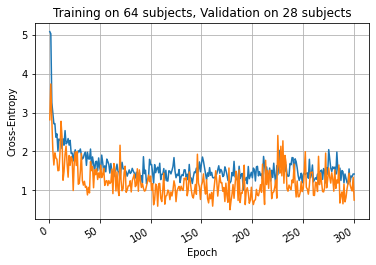

In [17]:
fig, ax = plt.subplots()
plot_epochs(ax, train_losses, 'Training')
plot_epochs(ax, val_losses, 'Validation')
ax.grid()
ax.set_xlabel('Epoch')
ax.set_ylabel('Cross-Entropy')
ax.set_title(f'Training on {len(training_subjects)} subjects, Validation on {len(validation_subjects)} subjects')
fig.autofmt_xdate()

In [18]:
class UnetEncoderSSL(nn.Module):
    def __init__(
        self, 
        patch_dim_x=28,
        patch_dim_z = 32,
        num_encoding_blocks=3,
        out_channels_first_layer=8,
        normalization='batch', 
        dropout=0
    ):
        super().__init__()
        
        self.patch_dim_x = patch_dim_x
        self.patch_dim_z = patch_dim_z
        self.num_encoding_blocks = num_encoding_blocks
        self.normalization = normalization
        self.dropout = dropout
        
        self.encoder = UNet(
            in_channels=1,
            out_classes=2,
            dimensions=3,
            num_encoding_blocks=num_encoding_blocks,
            out_channels_first_layer=out_channels_first_layer,
            normalization=normalization,
            upsampling_type='linear',
            padding=True,
            activation='PReLU',
            dropout=dropout
        ).encoder

        dx = patch_dim_x // 2**(num_encoding_blocks - 1)
        dz = patch_dim_z // 2**(num_encoding_blocks - 1)
        n_in = (num_encoding_blocks + 1) * out_channels_first_layer * dx**2 * dz
        n_out = n_in // 32
        
        self.fc1 = nn.Sequential(
            nn.Linear(n_in, n_out),
            nn.PReLU(),
            nn.BatchNorm1d(n_out)
        )
        self.fc = nn.Sequential(
            nn.Linear(2 * n_out, n_out // 2),
            nn.PReLU(),
            nn.Linear(n_out // 2, 8)
        )
        
        
    def forward_once(self, x):
        
        skip_connections, output = self.encoder(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        
        return output
    
    def forward(self, input1, input2):
        
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        output = torch.cat((output1, output2), dim=1)
        output = self.fc(output)
        
        return output

In [23]:
exp_name = 'relative_patch_instance_norm_dropout_lw'

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'

num_epochs = 200

model = UnetEncoderSSL(normalization='instance', dropout=0.3)
model = model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

train_losses, val_losses = train(num_epochs, training_loader, validation_loader, model, criterion, optimizer)
checkpoint = {
    'train_losses': train_losses,
    'val_losses': val_losses,
    'weights': model.state_dict(),
}
torch.save(checkpoint, os.path.join(path_saved_models, f'{exp_name}.pth'))

Starting epoch 1


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.101


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.957
Starting epoch 2


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 2.088


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.814
Starting epoch 3


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.990


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.826
Starting epoch 4


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.983


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.633
Starting epoch 5


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.874


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.586
Starting epoch 6


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.885


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.511
Starting epoch 7


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.827


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.544
Starting epoch 8


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.842


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.459
Starting epoch 9


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.779


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.355
Starting epoch 10


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.857


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.242
Starting epoch 11


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.804


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.149
Starting epoch 12


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.844


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.575
Starting epoch 13


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.726


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.330
Starting epoch 14


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.642


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.342
Starting epoch 15


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.719


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.294
Starting epoch 16


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.763


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.338
Starting epoch 17


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.594


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.226
Starting epoch 18


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.424


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.102
Starting epoch 19


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.637


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.424
Starting epoch 20


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.643


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.227
Starting epoch 21


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.737


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.956
Starting epoch 22


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.474


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.215
Starting epoch 23


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.594


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.267
Starting epoch 24


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.668


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.034
Starting epoch 25


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.399


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.959
Starting epoch 26


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.657


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.069
Starting epoch 27


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.554


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.009
Starting epoch 28


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.573


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.958
Starting epoch 29


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.488


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.937
Starting epoch 30


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.748


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.152
Starting epoch 31


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.395


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.030
Starting epoch 32


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.625


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.685
Starting epoch 33


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.776


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.028
Starting epoch 34


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.495


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.015
Starting epoch 35


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.525


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.090
Starting epoch 36


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.288


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.928
Starting epoch 37


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.665


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.993
Starting epoch 38


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.500


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.764
Starting epoch 39


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.454


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.874
Starting epoch 40


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.294


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.984
Starting epoch 41


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.647


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.914
Starting epoch 42


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.456


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.943
Starting epoch 43


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.393


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.810
Starting epoch 44


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.611


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.086
Starting epoch 45


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.335


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.922
Starting epoch 46


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.405


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.093
Starting epoch 47


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.489


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.087
Starting epoch 48


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.469


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.109
Starting epoch 49


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.541


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.137
Starting epoch 50


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.682


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.739
Starting epoch 51


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.597


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.664
Starting epoch 52


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.617


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.066
Starting epoch 53


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.161


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.736
Starting epoch 54


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.400


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.228
Starting epoch 55


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.358


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.282
Starting epoch 56


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.403


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.890
Starting epoch 57


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.655


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.830
Starting epoch 58


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.376


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.985
Starting epoch 59


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.353


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.046
Starting epoch 60


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.432


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.046
Starting epoch 61


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.573


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.892
Starting epoch 62


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.448


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.065
Starting epoch 63


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.340


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.106
Starting epoch 64


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.385


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.003
Starting epoch 65


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.411


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.311
Starting epoch 66


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.300


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.186
Starting epoch 67


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.558


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.999
Starting epoch 68


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.617


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.776
Starting epoch 69


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.449


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.952
Starting epoch 70


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.487


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.837
Starting epoch 71


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.527


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.747
Starting epoch 72


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.382


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.048
Starting epoch 73


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.444


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.954
Starting epoch 74


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.272


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.150
Starting epoch 75


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.387


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.641
Starting epoch 76


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.692


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.852
Starting epoch 77


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.315


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.880
Starting epoch 78


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.473


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.474
Starting epoch 79


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.496


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.925
Starting epoch 80


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.463


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.950
Starting epoch 81


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.529


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.929
Starting epoch 82


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.213


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.211
Starting epoch 83


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.345


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.724
Starting epoch 84


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.330


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.222
Starting epoch 85


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.286


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.809
Starting epoch 86


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.506


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.830
Starting epoch 87


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.404


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.022
Starting epoch 88


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.629


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.914
Starting epoch 89


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.522


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.836
Starting epoch 90


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.332


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.686
Starting epoch 91


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.512


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.994
Starting epoch 92


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.650


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.772
Starting epoch 93


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.404


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.983
Starting epoch 94


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.465


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.201
Starting epoch 95


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.521


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.714
Starting epoch 96


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.326


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.912
Starting epoch 97


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.653


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.792
Starting epoch 98


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.335


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.747
Starting epoch 99


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.412


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.945
Starting epoch 100


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.462


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.884
Starting epoch 101


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.397


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.043
Starting epoch 102


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.272


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.837
Starting epoch 103


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.232


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.774
Starting epoch 104


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.529


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.752
Starting epoch 105


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.383


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.848
Starting epoch 106


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 0.974


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.830
Starting epoch 107


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.545


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.222
Starting epoch 108


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.384


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.190
Starting epoch 109


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.485


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.920
Starting epoch 110


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.285


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.892
Starting epoch 111


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.240


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.939
Starting epoch 112


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.422


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.964
Starting epoch 113


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.323


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.744
Starting epoch 114


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.486


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.108
Starting epoch 115


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.351


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.865
Starting epoch 116


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.455


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.034
Starting epoch 117


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.263


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.045
Starting epoch 118


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.322


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.665
Starting epoch 119


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.610


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.004
Starting epoch 120


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.266


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.831
Starting epoch 121


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.300


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.837
Starting epoch 122


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.239


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.015
Starting epoch 123


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.332


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.697
Starting epoch 124


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.231


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.982
Starting epoch 125


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.599


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.149
Starting epoch 126


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.505


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.725
Starting epoch 127


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.413


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.776
Starting epoch 128


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.510


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.842
Starting epoch 129


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.191


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.929
Starting epoch 130


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.229


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.758
Starting epoch 131


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.279


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.958
Starting epoch 132


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.477


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.746
Starting epoch 133


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.357


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.732
Starting epoch 134


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.215


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.046
Starting epoch 135


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.152


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.971
Starting epoch 136


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.271


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.986
Starting epoch 137


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.300


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.836
Starting epoch 138


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.178


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.118
Starting epoch 139


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.409


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.738
Starting epoch 140


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.365


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.074
Starting epoch 141


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.408


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.754
Starting epoch 142


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.458


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.769
Starting epoch 143


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.265


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.839
Starting epoch 144


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.477


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.881
Starting epoch 145


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.425


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.801
Starting epoch 146


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.211


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.856
Starting epoch 147


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 0.995


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.882
Starting epoch 148


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.275


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.001
Starting epoch 149


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.242


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.624
Starting epoch 150


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 0.940


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.139
Starting epoch 151


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.451


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.007
Starting epoch 152


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.200


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.661
Starting epoch 153


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.255


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.117
Starting epoch 154


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.305


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.956
Starting epoch 155


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.388


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.753
Starting epoch 156


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.497


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.035
Starting epoch 157


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.162


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.573
Starting epoch 158


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.378


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.907
Starting epoch 159


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.311


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.868
Starting epoch 160


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.369


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.903
Starting epoch 161


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.532


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.889
Starting epoch 162


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.318


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.838
Starting epoch 163


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.600


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.701
Starting epoch 164


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.330


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.036
Starting epoch 165


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.457


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.847
Starting epoch 166


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.309


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.740
Starting epoch 167


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.230


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.812
Starting epoch 168


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.465


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.047
Starting epoch 169


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.273


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.880
Starting epoch 170


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.453


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.928
Starting epoch 171


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.369


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.853
Starting epoch 172


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.258


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.944
Starting epoch 173


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.364


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.881
Starting epoch 174


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.179


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.831
Starting epoch 175


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.396


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.738
Starting epoch 176


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.240


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.716
Starting epoch 177


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.302


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.955
Starting epoch 178


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.250


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.968
Starting epoch 179


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.401


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.610
Starting epoch 180


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.199


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.773
Starting epoch 181


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.325


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.679
Starting epoch 182


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.418


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.810
Starting epoch 183


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.259


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.331
Starting epoch 184


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.421


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.877
Starting epoch 185


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.128


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.923
Starting epoch 186


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.313


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.080
Starting epoch 187


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.238


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.898
Starting epoch 188


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.227


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.077
Starting epoch 189


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.378


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.812
Starting epoch 190


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.226


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.230
Starting epoch 191


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.445


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.036
Starting epoch 192


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.421


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.002
Starting epoch 193


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.281


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.991
Starting epoch 194


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.525


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.176
Starting epoch 195


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.205


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.929
Starting epoch 196


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.021


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 1.040
Starting epoch 197


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.391


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.927
Starting epoch 198


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.265


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.932
Starting epoch 199


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.155


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.624
Starting epoch 200


  0%|          | 0/32 [00:00<?, ?it/s]

Training mean loss: 1.423


  0%|          | 0/7 [00:00<?, ?it/s]

Validation mean loss: 0.748


In [20]:
summary(model)

Layer (type:depth-idx)                                  Param #
UnetEncoderSSL                                          --
├─Encoder: 1-1                                          --
│    └─ModuleList: 2-1                                  --
│    │    └─EncodingBlock: 3-1                          3,682
│    │    └─EncodingBlock: 3-2                          20,738
├─Sequential: 1-2                                       --
│    └─Linear: 2-2                                      4,917,640
│    └─PReLU: 2-3                                       1
│    └─BatchNorm1d: 2-4                                 784
├─Sequential: 1-3                                       --
│    └─Linear: 2-5                                      153,860
│    └─PReLU: 2-6                                       1
│    └─Linear: 2-7                                      1,576
Total params: 5,098,282
Trainable params: 5,098,282
Non-trainable params: 0

## Check information leakage with volume hashes ...